In [0]:
googlecolab = True

if googlecolab:
    from os.path import exists
    from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
    platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())
    cuda_output = !ldconfig -p|grep cudart.so|sed -e 's/.*\.\([0-9]*\)\.\([0-9]*\)$/cu\1\2/'
    accelerator = cuda_output[0] if exists('/dev/nvidia0') else 'cpu'

    !pip install -q http://download.pytorch.org/whl/{accelerator}/torch-0.4.1-{platform}-linux_x86_64.whl torchvision
    !pip install Pillow==4.1.1

  ERROR: HTTP error 403 while getting http://download.pytorch.org/whl/cu101/torch-0.4.1-cp36-cp36m-linux_x86_64.whl
  ERROR: Could not install requirement torch==0.4.1 from http://download.pytorch.org/whl/cu101/torch-0.4.1-cp36-cp36m-linux_x86_64.whl because of error 403 Client Error: Forbidden for url: http://download.pytorch.org/whl/cu101/torch-0.4.1-cp36-cp36m-linux_x86_64.whl
ERROR: Could not install requirement torch==0.4.1 from http://download.pytorch.org/whl/cu101/torch-0.4.1-cp36-cp36m-linux_x86_64.whl because of HTTP error 403 Client Error: Forbidden for url: http://download.pytorch.org/whl/cu101/torch-0.4.1-cp36-cp36m-linux_x86_64.whl for URL http://download.pytorch.org/whl/cu101/torch-0.4.1-cp36-cp36m-linux_x86_64.whl


In [0]:
%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

## Hyperpameters

Define the hyperparameters. You can play with those later.

In [0]:
## Data loading

workers = 4 # Number of workers for dataloader (/!\ set to 4 when you're done debugging)

## Architecture

arch = 'cDCGAN' # or cGAN
# arch = 'cGAN' # or cDCGAN
nz = 100 # Size of z latent vector (i.e. size of generator input)µ
ndf = 32 # Base size of feature maps in discriminator
ngf = 32 # Base size of feature maps in generator

## Optimization

lrD = 0.0002 # Learning rate for the discriminator
lrG = 0.0002 # Learning rate for the generator
beta1G = 0.5 # Momentum beta1 for the discriminator
beta1D = 0.5 # Momentum beta1 for the generator

## Training

batch_size = 128 # Images per batch
nb_update_D = 1 # Number of sub-steps of discriminator optim. at each step
nb_update_G = 1 # Number of sub-steps of generator optim. at each step
steps = 8000 # Number of global steps in the training loop
nb_epochs = 20 # Number of epochs, leave "None" if you want to set the number of "steps" (i.e. batches)


if nb_epochs is None:
    nb_epochs = (steps * batch_size) / (nb_update_D * 50000)
else:
    steps = int(nb_epochs * nb_update_D * 50000 / batch_size)
print("Doing %.1f epochs in %d steps" % (nb_epochs, steps))
steps_per_epoch = int(steps / nb_epochs)

Doing 20.0 epochs in 7812 steps


# Dataset

Download and load the dataset. Nothing to do here.

0it [00:00, ?it/s]

9920512it [00:02, 3709429.22it/s]                             


Extracting /tmp/mnist/MNIST/raw/train-images-idx3-ubyte.gz to /tmp/mnist/MNIST/raw


0it [00:00, ?it/s]

32768it [00:00, 57685.24it/s]                           
0it [00:00, ?it/s]

Extracting /tmp/mnist/MNIST/raw/train-labels-idx1-ubyte.gz to /tmp/mnist/MNIST/raw


1654784it [00:01, 962351.97it/s]                             
0it [00:00, ?it/s]

Extracting /tmp/mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to /tmp/mnist/MNIST/raw


8192it [00:00, 22179.32it/s]            

Extracting /tmp/mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to /tmp/mnist/MNIST/raw
Processing...
Done!


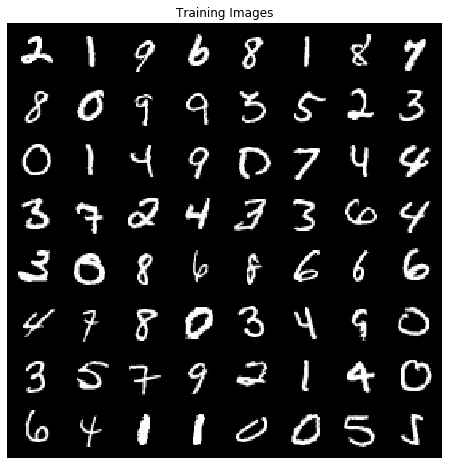

In [0]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataroot = '/tmp/mnist'
transform = transforms.Compose([
        transforms.Pad(2),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5,), std=(0.5,))
])
dataset = dset.MNIST(dataroot, train=True, download=True, transform=transform)
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

# Model architectures

## Discriminator

Input: Image $x \in \mathbb{R}^{32\times 32\times 1}$  
Output: "Real" image probability $\in [0,1]$

## Generator

Input: Random "noise" $z \in \mathbb{R}^{\text{nz}}$  
Output: Generated image $\tilde x \in \mathbb{R}^{32\times 32\times 1}$


In [0]:
for x,y in dataloader:
  break

In [0]:
x,y = next(iter(dataloader))
x2,y2 = next(iter(dataloader))
torch.all(y==y2)

tensor(False)

In [0]:
y, y2

(tensor([8, 8, 6, 6, 1, 0, 8, 4, 4, 3, 5, 0, 6, 9, 6, 1, 5, 1, 9, 7, 8, 3, 4, 0,
         1, 2, 0, 7, 7, 7, 9, 1, 1, 4, 4, 7, 8, 6, 3, 2, 1, 0, 3, 8, 2, 8, 1, 8,
         2, 8, 8, 3, 6, 7, 7, 9, 3, 2, 4, 3, 2, 9, 1, 1, 0, 6, 0, 4, 1, 8, 4, 7,
         4, 8, 1, 3, 1, 0, 3, 2, 1, 5, 6, 1, 3, 3, 1, 6, 3, 1, 2, 3, 6, 6, 6, 5,
         4, 6, 0, 2, 1, 1, 6, 2, 6, 6, 3, 4, 4, 4, 7, 6, 7, 6, 9, 2, 6, 6, 9, 7,
         1, 3, 6, 0, 5, 0, 0, 9]),
 tensor([9, 8, 0, 9, 1, 6, 7, 8, 7, 1, 4, 2, 6, 2, 4, 9, 9, 1, 5, 0, 3, 4, 6, 7,
         1, 3, 7, 1, 1, 6, 3, 4, 1, 6, 5, 9, 2, 0, 8, 9, 1, 4, 0, 3, 9, 7, 3, 3,
         7, 6, 2, 0, 8, 2, 1, 4, 8, 7, 5, 6, 0, 4, 8, 4, 0, 1, 2, 3, 1, 6, 9, 4,
         0, 5, 1, 1, 8, 8, 7, 4, 2, 0, 3, 5, 7, 2, 1, 5, 0, 3, 2, 7, 9, 0, 8, 1,
         1, 3, 8, 9, 1, 8, 3, 9, 6, 2, 7, 5, 8, 3, 5, 1, 4, 7, 6, 0, 6, 1, 2, 1,
         8, 0, 5, 4, 7, 9, 8, 7]))

In [0]:
yy = torch.zeros(len(y),10)
print(yy.shape)
yy[torch.arange(len(y)),y] = 1
yy[1]


torch.Size([128, 10])


tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0.])

In [0]:
(32,32)+yy.size()

(32, 32, 128, 10)

In [0]:
# torch.expand()
print(yy[0].size())
yy.expand((32,32)+yy.size()).permute([2,3,0,1])[1,:,0,0]


torch.Size([10])


tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0.])

In [0]:
y1 = torch.zeros(10,4,16,16)
y2 = torch.ones(10,4,16,16)
torch.cat([y1,y2], dim=1).shape

torch.Size([10, 8, 16, 16])

In [0]:
# cDCGAN

if arch == 'cDCGAN':
    
    class Discriminator(nn.Module):
        def __init__(self):
            super(Discriminator, self).__init__()
            self.emb_x = nn.Sequential(
                # TODO
                nn.Conv2d(1,64,4,2,1),
                nn.LeakyReLU(0.2)
            )
            self.emb_y = nn.Sequential(
                # TODO
                nn.Conv2d(10,64,4,2,1),
                nn.LeakyReLU(0.2)

            )
            self.emb_xy = nn.Sequential(
                # TODO
                nn.Conv2d(128,256,4,2,1,bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.2),

                nn.Conv2d(256,512,4,2,1,bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(0.2),

                nn.Conv2d(512,1,4,1,0),
                nn.Sigmoid()
            )

        def forward(self, x, y):
            #TODO
            emb_x = self.emb_x(x)
            # y = y.expand((32,32)+y.size()).permute([2,3,0,1])
            """
            if len(y.size())>2:
              y = y.view(y.size()[:-2])
            y = y.expand((32,32)+y.size()).permute(list((np.arange(len(y.size()))+2))+[0,1])
            """
            y = y.expand(y.size()[:2]+(32,32))
            emb_y = self.emb_y(y)
            emb_xy = torch.cat([emb_x,emb_y],dim=1)
            o = self.emb_xy(emb_xy)

            return o



    class Generator(nn.Module):
        def __init__(self):
            super(Generator, self).__init__()
            self.emb_z = nn.Sequential(
                # TODO
                nn.ConvTranspose2d(nz,256,4,1,0,bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU()
            )
            self.emb_y = nn.Sequential(
                # TODO
                nn.ConvTranspose2d(10,256,4,1,0,bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU()
            )
            self.emb_zy = nn.Sequential(
                # TODO
                nn.ConvTranspose2d(512,256,4,2,1,bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(),

                nn.ConvTranspose2d(256,128,4,2,1,bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(),

                nn.ConvTranspose2d(128,1,4,2,1),
                nn.Tanh()
            )

        def forward(self, z, y):
            # TODO
            emb_z = self.emb_z(z)
            emb_y = self.emb_y(y)
            emb_zy = torch.cat([emb_z,emb_y],dim=1)
            o = self.emb_zy(emb_zy)
            return o

In [0]:
list((np.arange(len(y.size()))+2))+[0,1]

[2, 0, 1]

In [0]:
# cGAN

if arch == 'cGAN':

    class Discriminator(nn.Module):

        def __init__(self):
            super(Discriminator, self).__init__()
            self.emb_x = nn.Sequential(nn.Linear(1024, 1024),
                    nn.LeakyReLU(0.2))  # TODO
            
            self.emb_y = nn.Sequential(nn.Linear(10, 1024),
                    nn.LeakyReLU(0.2))  # TODO
            
            self.emb_xy = nn.Sequential(  # TODO
                nn.Linear(1024 + 1024, 1024, bias=False),
                nn.BatchNorm1d(1024),
                nn.LeakyReLU(0.2),
                nn.Linear(1024, 512, bias=False),
                nn.BatchNorm1d(512),
                nn.LeakyReLU(0.2),
                nn.Linear(512, 1),
                nn.Sigmoid(),
                )

        def forward(self, x, y):

            # TODO
            x = x.squeeze(1).view(x.size(0),-1)
            
            x_embedded = self.emb_x(x)

            y = y.view(y.size(0),-1)
            y_embedded = self.emb_y(y)


            xy = torch.cat([x_embedded, y_embedded], dim=1)
            o = self.emb_xy(xy)
    
            return o


    class Generator(nn.Module):

        def __init__(self):

        
          super(Generator, self).__init__()

          self.emb_z = nn.Sequential(nn.Linear(nz, 256, bias=False),
                  nn.BatchNorm1d(256), nn.ReLU())  # TODO

          self.emb_y = nn.Sequential(nn.Linear(10, 256, bias=False),
                  nn.BatchNorm1d(256), nn.ReLU())  # TODO

          self.emb_zy = nn.Sequential(  # TODO
              nn.Linear(256 + 256, 512, bias=False),
              nn.BatchNorm1d(512),
              nn.ReLU(),
              nn.Linear(512, 1024, bias=False),
              nn.BatchNorm1d(1024),
              nn.ReLU(),
              nn.Linear(1024, 1024),
              nn.Tanh(),
            )
                  
                  
        def forward(self, z, y):


          # Remove unused dimensions in non-conv model

          z = z.view(z.shape[0], -1)  
          # z[:, :, 0, 0]
          y = y.view(y.shape[0], -1)
          # TODO
          z_embedded = self.emb_z(z)
          y_embedded = self.emb_y(y)

          zy = torch.cat([z_embedded, y_embedded], dim=1)
   
          o = self.emb_zy(zy)

          return o


In [0]:
# Create the models
netG = Generator().to(device)
netD = Discriminator().to(device)

# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)
netG.apply(weights_init)
netD.apply(weights_init)

# Print the models
print(netG)
print(netD)

Generator(
  (emb_z): Sequential(
    (0): ConvTranspose2d(100, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (emb_y): Sequential(
    (0): ConvTranspose2d(10, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (emb_zy): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(128, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): Tanh()
  )
)
Discriminator(
  (emb_

In [0]:
# TODO test you models to check if they 
z = torch.zeros(10, nz, 1, 1).to(device)
x = torch.zeros(10, 1, 32, 32).to(device)
y = torch.randn(10, 10, 1, 1).to(device)
print(netG(z, y).shape) # expected: [10, 1, 32, 32]
print(netD(x, y).shape) # expected: [10, 1, 1, 1]

torch.Size([10, 1, 32, 32])
torch.Size([10, 1, 1, 1])


# Optimization and training

Here we will define:
* Our prior $P(z)$ that we use to sample random "noise". We will use a Gaussian distribution.
* The criterion that will be used to train the discriminator, and indirectly the generator. We will use the binary cross-entropy.
* The optimizers of both models. We will use the Adam optimizer.

In [0]:
# Prior P(z). Returns a Gaussian random tensor of shape (batch_size, nz, 1, 1)
def get_noise(batch_size):
    noise = torch.randn(batch_size, nz, 1, 1)
    return noise

# Returns a random vector of one-hot encoding of shape (batch_size, 10, 1, 1)
def get_fixed_y(batch_size):
    y = torch.zeros(batch_size, 10, 1, 1, device=device)
    n = batch_size // 10
    for i in range(10):
        y[i*n:i*n+n, i, :, :].fill_(1)
    return y

# Create the criterion function that will take (y_hat, y) as input
criterion = nn.BCELoss() # TODO

# Setup Adam optimizers for D and G
optimizerD = optim.Adam(netD.parameters(),lr=lrD, betas=(beta1D,0.999)) # TODO
optimizerG = optim.Adam(netG.parameters(),lr=lrG, betas=(beta1G,0.999)) # TODO


### Data format / batch creation functions

`r_real` and `r_fake` are targets for the disriminator's criterion

In [0]:
x,y = next(iter(dataloader))
y.shape

torch.Size([128])

In [0]:
# Data format / batch creation functions

fixed_noise = get_noise(100) # Create a fixed random vector sampled from a Gaussian, will be used during train for viz
fixed_y = get_fixed_y(100)
real_label = 1
fake_label = 0
iterator = iter(dataloader)

def onehot(data, nclass=10):
    bsize = data.shape[0]
    y = torch.zeros(bsize, nclass)
    y.scatter_(1, data.unsqueeze(1), 1)
    y = y.unsqueeze(2).unsqueeze(3)
    return y

# returns a batch of real images from the dataset (iterates infinitely on the dataset)
def get_batch_real():
    global iterator
    try:
        x_real, y_real = next(iterator)
    except:
        iterator = iter(dataloader)
        x_real, y_real = next(iterator)
    x_real = x_real.to(device)
    y_real = onehot(y_real).to(device)
    r_real = torch.full((x_real.size(0),), real_label, device=device)
    return x_real.to(device), y_real.to(device), r_real.to(device)

# returns a batch of generated images and training targets y_fake
# Note that the targets y_fake will be different is train_G is True or False
def get_batch_fake(y_real, train_G=False):
    z = torch.randn(y_real.shape[0], nz, 1, 1, device=device)
    x_fake = netG(z, y_real)
    if train_G:
        r_fake = torch.ones(y_real.shape[0])*real_label # TODO
    else:
        r_fake = torch.ones(y_real.shape[0])*fake_label # TODO
    return x_fake.to(device), y_real.to(device), r_fake.to(device)

In [0]:
x,y,r = get_batch_real()
x.shape, y.shape, r.shape

(torch.Size([128, 1, 32, 32]), torch.Size([128, 10, 1, 1]), torch.Size([128]))

In [0]:
x2,y2,r2 = get_batch_fake(y)
x2.shape, y2.shape, r2.shape

(torch.Size([128, 1, 32, 32]), torch.Size([128, 10, 1, 1]), torch.Size([128]))

### Training Loop

**Reminder:** when your training loop starts to work, change the `workers` variable to 4 and rerun your notebook

In [0]:
img_list = []
G_losses = []
D_losses = []

[    0/ 7812]	Loss_D: 2.1766	Loss_G: 0.7392	D(x): 0.3221	D(G(z)): 0.4360


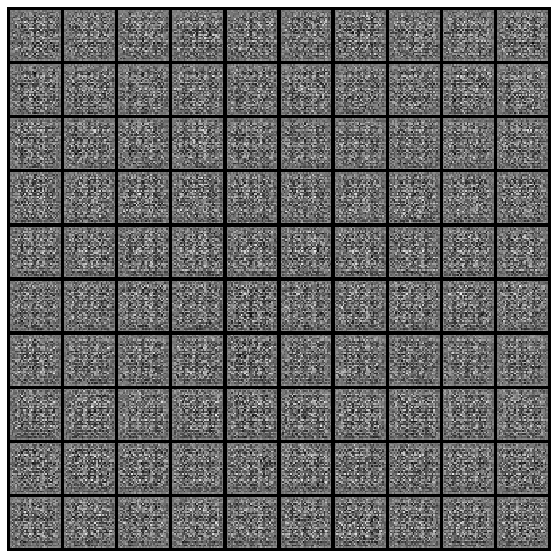

[   25/ 7812]	Loss_D: 1.9498	Loss_G: 2.4501	D(x): 0.2112	D(G(z)): 0.0012
[   50/ 7812]	Loss_D: 0.5480	Loss_G: 5.2040	D(x): 0.9315	D(G(z)): 0.3684
[   75/ 7812]	Loss_D: 1.3594	Loss_G: 2.3171	D(x): 0.3812	D(G(z)): 0.0113
[  100/ 7812]	Loss_D: 1.0821	Loss_G: 2.2264	D(x): 0.5710	D(G(z)): 0.2814


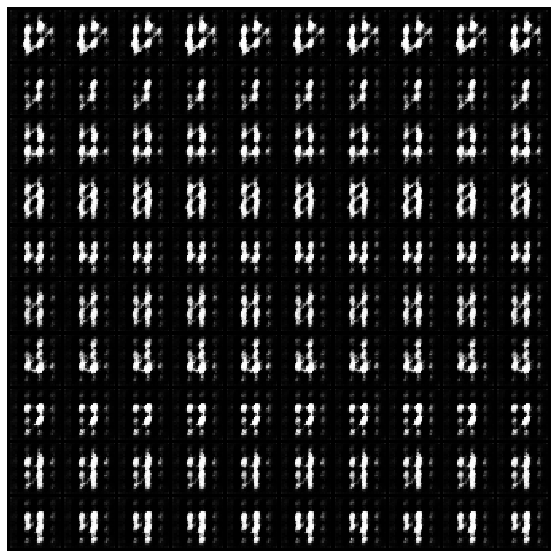

[  125/ 7812]	Loss_D: 2.4273	Loss_G: 1.7729	D(x): 0.1949	D(G(z)): 0.0154
[  150/ 7812]	Loss_D: 0.8088	Loss_G: 3.3321	D(x): 0.8224	D(G(z)): 0.4196
[  175/ 7812]	Loss_D: 0.8998	Loss_G: 4.7811	D(x): 0.8910	D(G(z)): 0.5136
[  200/ 7812]	Loss_D: 1.4107	Loss_G: 1.7196	D(x): 0.3980	D(G(z)): 0.0516


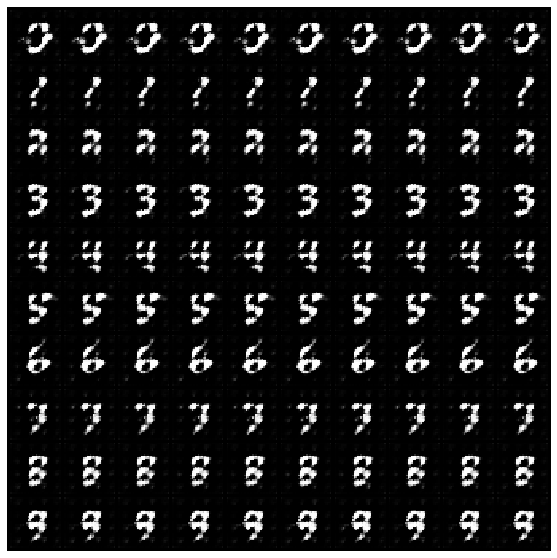

[  225/ 7812]	Loss_D: 1.1667	Loss_G: 2.2572	D(x): 0.7973	D(G(z)): 0.4741
[  250/ 7812]	Loss_D: 0.8892	Loss_G: 3.6322	D(x): 0.7967	D(G(z)): 0.4326
[  275/ 7812]	Loss_D: 0.6591	Loss_G: 2.1753	D(x): 0.6651	D(G(z)): 0.0672
[  300/ 7812]	Loss_D: 0.5784	Loss_G: 3.7642	D(x): 0.8635	D(G(z)): 0.3089


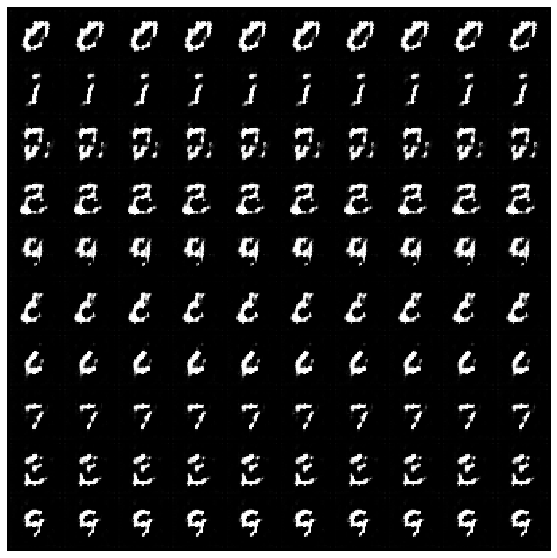

[  325/ 7812]	Loss_D: 0.8707	Loss_G: 5.0611	D(x): 0.8410	D(G(z)): 0.4394
[  350/ 7812]	Loss_D: 0.6167	Loss_G: 4.3387	D(x): 0.8840	D(G(z)): 0.3398
[  375/ 7812]	Loss_D: 1.1228	Loss_G: 2.8778	D(x): 0.5417	D(G(z)): 0.0478
[  400/ 7812]	Loss_D: 0.6251	Loss_G: 3.7125	D(x): 0.7971	D(G(z)): 0.2553


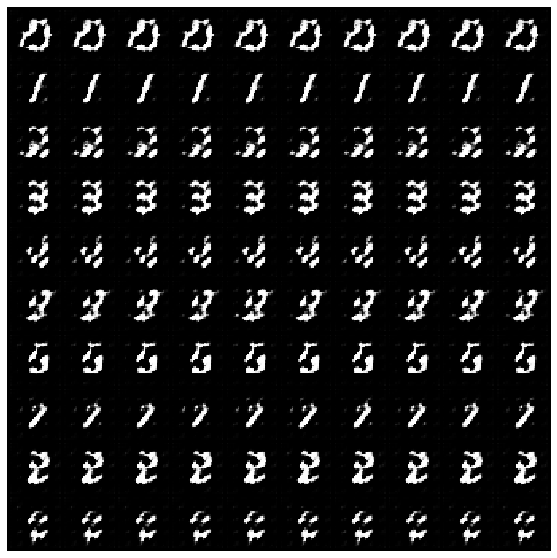

[  425/ 7812]	Loss_D: 0.8073	Loss_G: 2.3849	D(x): 0.5946	D(G(z)): 0.0321
[  450/ 7812]	Loss_D: 0.6223	Loss_G: 3.6463	D(x): 0.7192	D(G(z)): 0.0181
[  475/ 7812]	Loss_D: 0.5263	Loss_G: 3.2364	D(x): 0.8724	D(G(z)): 0.2689
[  500/ 7812]	Loss_D: 0.3687	Loss_G: 3.5604	D(x): 0.8881	D(G(z)): 0.1947


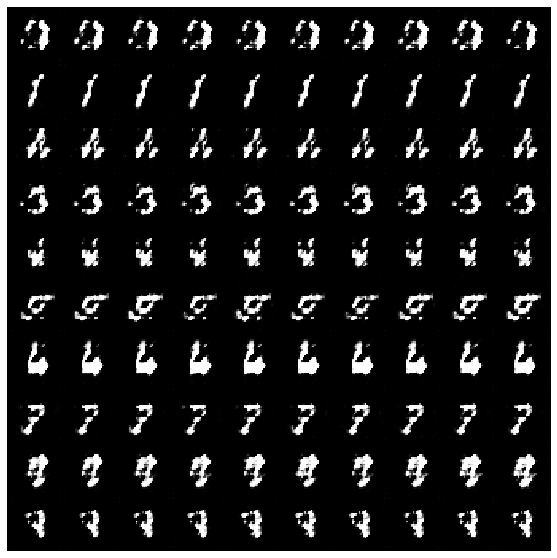

[  525/ 7812]	Loss_D: 0.5170	Loss_G: 3.3772	D(x): 0.7234	D(G(z)): 0.0558
[  550/ 7812]	Loss_D: 0.4107	Loss_G: 2.9280	D(x): 0.8391	D(G(z)): 0.1381
[  575/ 7812]	Loss_D: 0.4463	Loss_G: 3.3973	D(x): 0.7801	D(G(z)): 0.0823
[  600/ 7812]	Loss_D: 0.2835	Loss_G: 3.9349	D(x): 0.9044	D(G(z)): 0.1268


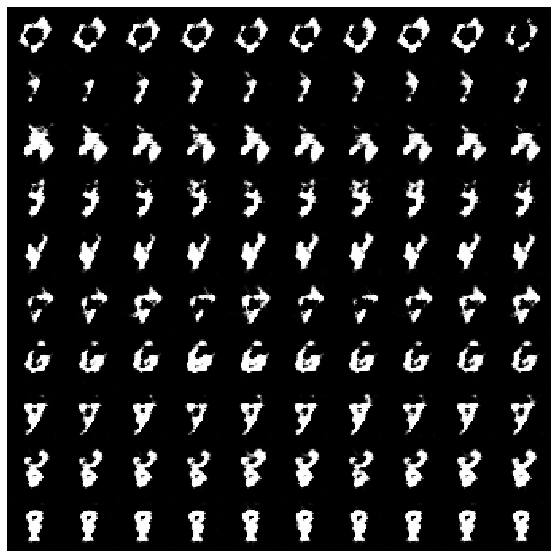

[  625/ 7812]	Loss_D: 1.0962	Loss_G: 9.0369	D(x): 0.9552	D(G(z)): 0.5592
[  650/ 7812]	Loss_D: 0.2621	Loss_G: 4.0829	D(x): 0.8785	D(G(z)): 0.0961
[  675/ 7812]	Loss_D: 0.3075	Loss_G: 4.0935	D(x): 0.9331	D(G(z)): 0.1881
[  700/ 7812]	Loss_D: 0.4947	Loss_G: 2.4380	D(x): 0.7591	D(G(z)): 0.0774


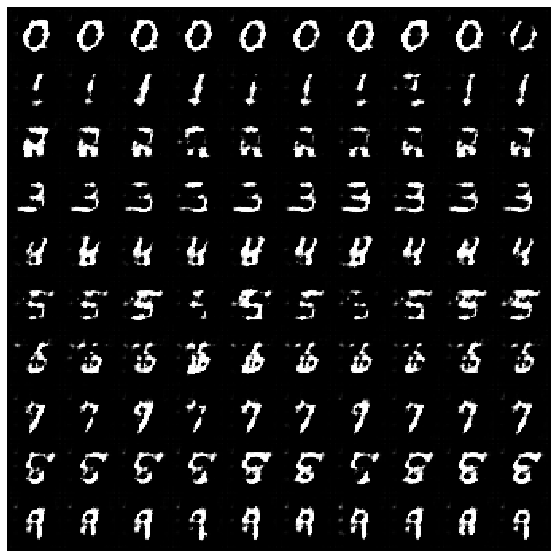

[  725/ 7812]	Loss_D: 0.3026	Loss_G: 3.6266	D(x): 0.9087	D(G(z)): 0.1570
[  750/ 7812]	Loss_D: 0.5939	Loss_G: 4.2841	D(x): 0.8965	D(G(z)): 0.2847
[  775/ 7812]	Loss_D: 0.7063	Loss_G: 5.0664	D(x): 0.9039	D(G(z)): 0.3565
[  800/ 7812]	Loss_D: 0.2773	Loss_G: 3.5465	D(x): 0.8556	D(G(z)): 0.0522


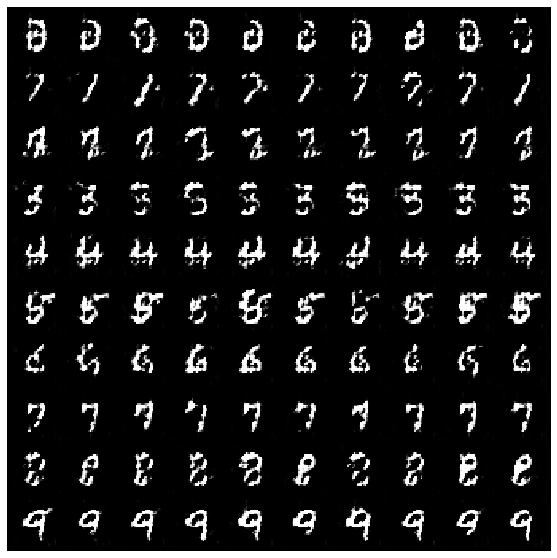

[  825/ 7812]	Loss_D: 0.5592	Loss_G: 2.4204	D(x): 0.7190	D(G(z)): 0.0689
[  850/ 7812]	Loss_D: 0.9964	Loss_G: 1.2561	D(x): 0.5566	D(G(z)): 0.0702
[  875/ 7812]	Loss_D: 0.9416	Loss_G: 2.5296	D(x): 0.6802	D(G(z)): 0.2252
[  900/ 7812]	Loss_D: 0.5938	Loss_G: 2.7412	D(x): 0.7090	D(G(z)): 0.0777


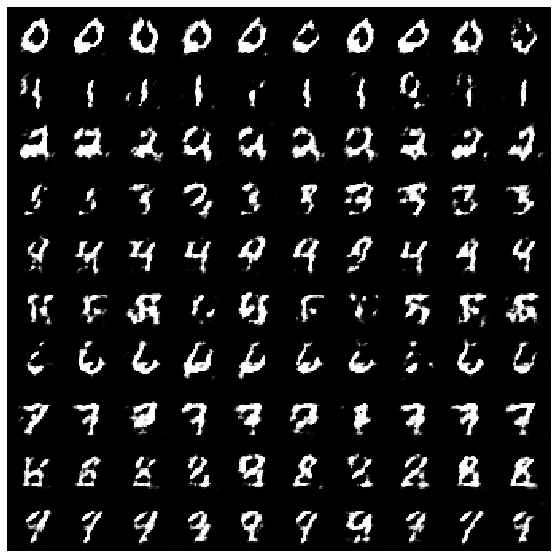

[  925/ 7812]	Loss_D: 0.6077	Loss_G: 2.5546	D(x): 0.7493	D(G(z)): 0.1863
[  950/ 7812]	Loss_D: 0.6377	Loss_G: 2.3854	D(x): 0.7515	D(G(z)): 0.1797
[  975/ 7812]	Loss_D: 0.5611	Loss_G: 2.9439	D(x): 0.7743	D(G(z)): 0.1694
[ 1000/ 7812]	Loss_D: 0.6559	Loss_G: 2.8685	D(x): 0.8165	D(G(z)): 0.2902


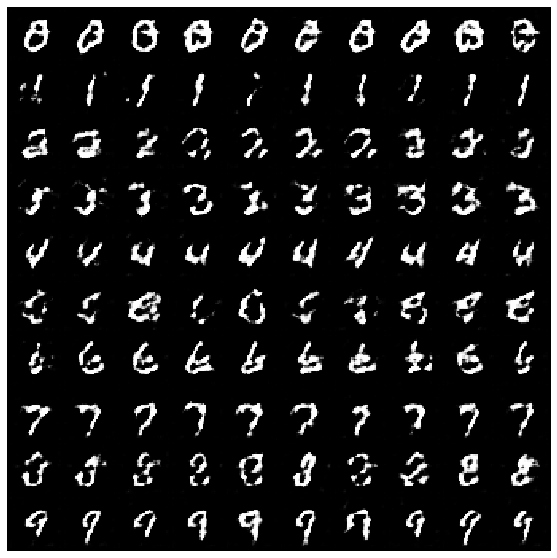

[ 1025/ 7812]	Loss_D: 0.7013	Loss_G: 3.2897	D(x): 0.8713	D(G(z)): 0.3609
[ 1050/ 7812]	Loss_D: 0.7134	Loss_G: 1.5782	D(x): 0.6950	D(G(z)): 0.1974
[ 1075/ 7812]	Loss_D: 0.7718	Loss_G: 1.3704	D(x): 0.6546	D(G(z)): 0.1748
[ 1100/ 7812]	Loss_D: 0.7898	Loss_G: 2.6188	D(x): 0.8141	D(G(z)): 0.3515


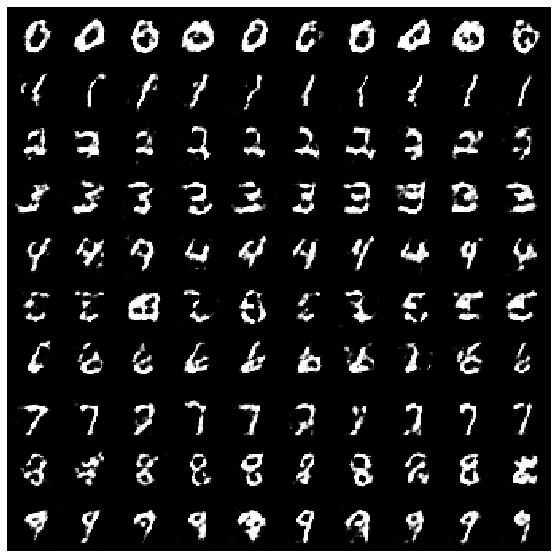

[ 1125/ 7812]	Loss_D: 1.4505	Loss_G: 0.6725	D(x): 0.3949	D(G(z)): 0.0950
[ 1150/ 7812]	Loss_D: 1.0237	Loss_G: 0.9592	D(x): 0.5501	D(G(z)): 0.1543
[ 1175/ 7812]	Loss_D: 0.8699	Loss_G: 1.6338	D(x): 0.6284	D(G(z)): 0.2290
[ 1200/ 7812]	Loss_D: 0.8353	Loss_G: 1.3542	D(x): 0.6590	D(G(z)): 0.2363


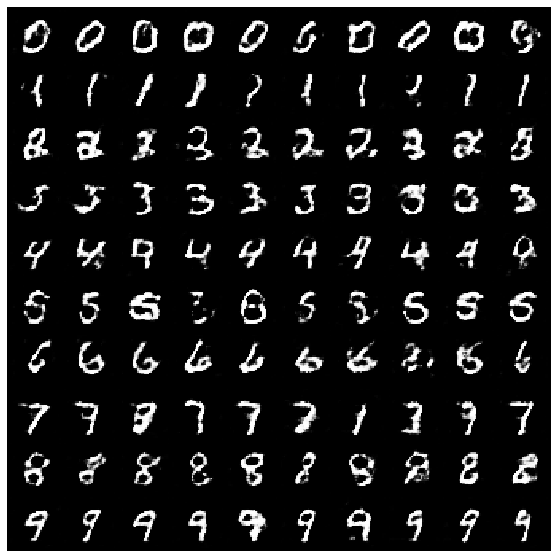

[ 1225/ 7812]	Loss_D: 1.6559	Loss_G: 3.4389	D(x): 0.9166	D(G(z)): 0.7011
[ 1250/ 7812]	Loss_D: 1.1112	Loss_G: 2.9738	D(x): 0.8025	D(G(z)): 0.5224
[ 1275/ 7812]	Loss_D: 1.0197	Loss_G: 1.6257	D(x): 0.6398	D(G(z)): 0.2823
[ 1300/ 7812]	Loss_D: 1.3436	Loss_G: 0.8427	D(x): 0.4189	D(G(z)): 0.1201


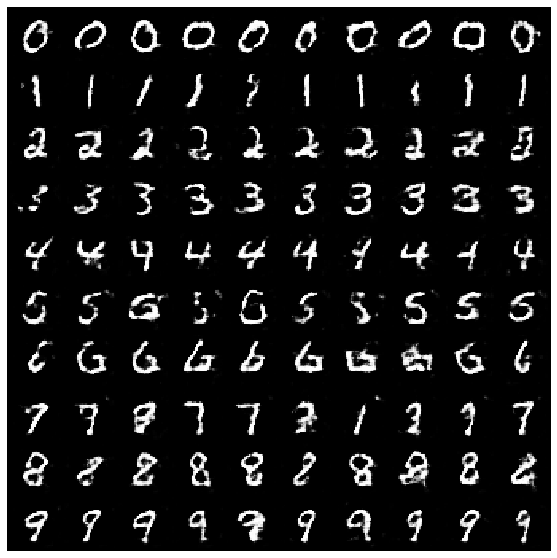

[ 1325/ 7812]	Loss_D: 1.0931	Loss_G: 2.7195	D(x): 0.8309	D(G(z)): 0.4875
[ 1350/ 7812]	Loss_D: 1.1610	Loss_G: 2.5390	D(x): 0.7769	D(G(z)): 0.5262
[ 1375/ 7812]	Loss_D: 0.9994	Loss_G: 1.2427	D(x): 0.5497	D(G(z)): 0.1979
[ 1400/ 7812]	Loss_D: 1.0894	Loss_G: 2.0272	D(x): 0.7205	D(G(z)): 0.4579


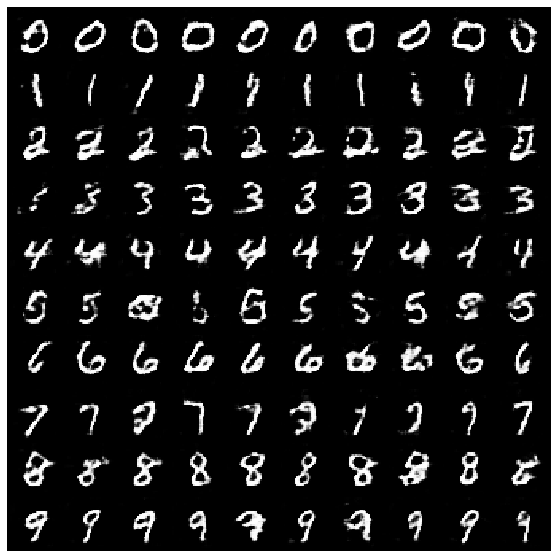

[ 1425/ 7812]	Loss_D: 1.0562	Loss_G: 1.0672	D(x): 0.5301	D(G(z)): 0.2338
[ 1450/ 7812]	Loss_D: 1.4676	Loss_G: 2.7621	D(x): 0.8993	D(G(z)): 0.6624
[ 1475/ 7812]	Loss_D: 0.9572	Loss_G: 2.0961	D(x): 0.8146	D(G(z)): 0.4567
[ 1500/ 7812]	Loss_D: 1.2754	Loss_G: 1.6653	D(x): 0.6771	D(G(z)): 0.4991


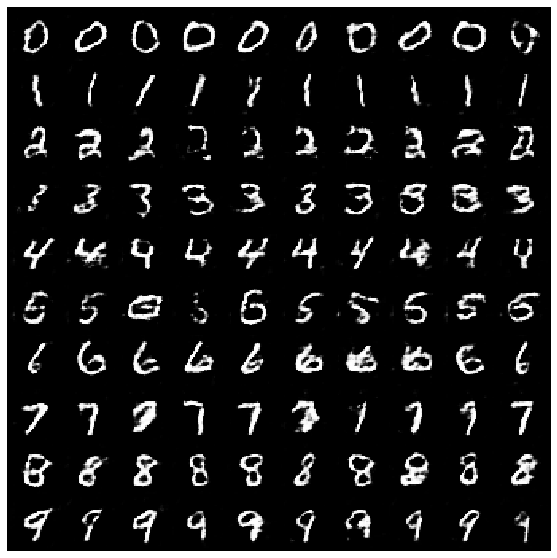

[ 1525/ 7812]	Loss_D: 1.0942	Loss_G: 1.0020	D(x): 0.5402	D(G(z)): 0.2554
[ 1550/ 7812]	Loss_D: 1.0346	Loss_G: 1.1246	D(x): 0.5656	D(G(z)): 0.2558
[ 1575/ 7812]	Loss_D: 1.2796	Loss_G: 1.0087	D(x): 0.4469	D(G(z)): 0.2189
[ 1600/ 7812]	Loss_D: 1.0996	Loss_G: 1.2007	D(x): 0.5548	D(G(z)): 0.3075


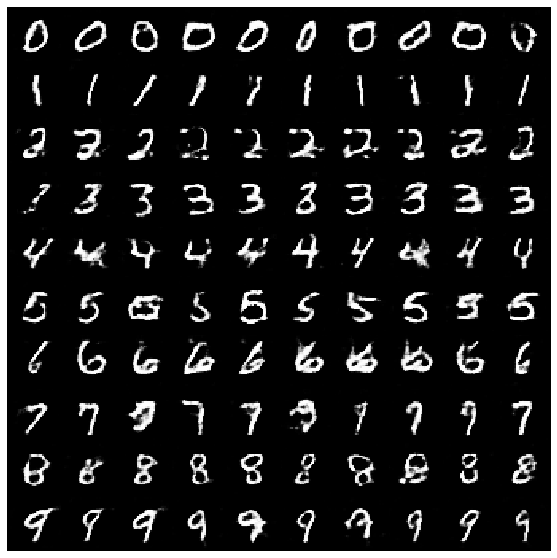

[ 1625/ 7812]	Loss_D: 1.0246	Loss_G: 2.1268	D(x): 0.7763	D(G(z)): 0.4714
[ 1650/ 7812]	Loss_D: 1.1116	Loss_G: 1.4037	D(x): 0.7334	D(G(z)): 0.4860
[ 1675/ 7812]	Loss_D: 1.2724	Loss_G: 0.7514	D(x): 0.4375	D(G(z)): 0.2005
[ 1700/ 7812]	Loss_D: 1.2224	Loss_G: 1.6888	D(x): 0.7018	D(G(z)): 0.5121


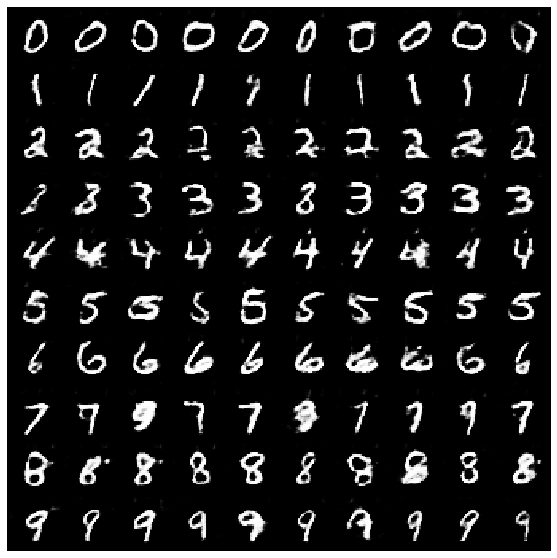

[ 1725/ 7812]	Loss_D: 1.2450	Loss_G: 0.7472	D(x): 0.4556	D(G(z)): 0.2604
[ 1750/ 7812]	Loss_D: 1.0607	Loss_G: 1.0760	D(x): 0.6188	D(G(z)): 0.3779
[ 1775/ 7812]	Loss_D: 1.1355	Loss_G: 0.8675	D(x): 0.5187	D(G(z)): 0.2756
[ 1800/ 7812]	Loss_D: 1.1903	Loss_G: 1.1909	D(x): 0.5727	D(G(z)): 0.3596


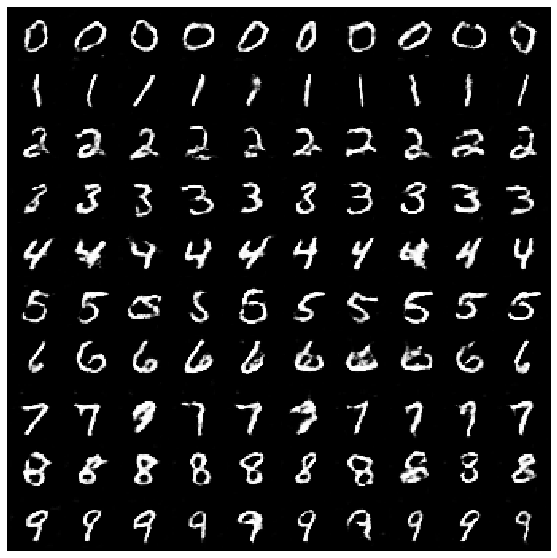

[ 1825/ 7812]	Loss_D: 1.1583	Loss_G: 1.0893	D(x): 0.5473	D(G(z)): 0.3367
[ 1850/ 7812]	Loss_D: 1.1055	Loss_G: 1.6033	D(x): 0.7247	D(G(z)): 0.4862
[ 1875/ 7812]	Loss_D: 1.0990	Loss_G: 0.8743	D(x): 0.5287	D(G(z)): 0.2814
[ 1900/ 7812]	Loss_D: 1.1428	Loss_G: 0.8715	D(x): 0.5593	D(G(z)): 0.3319


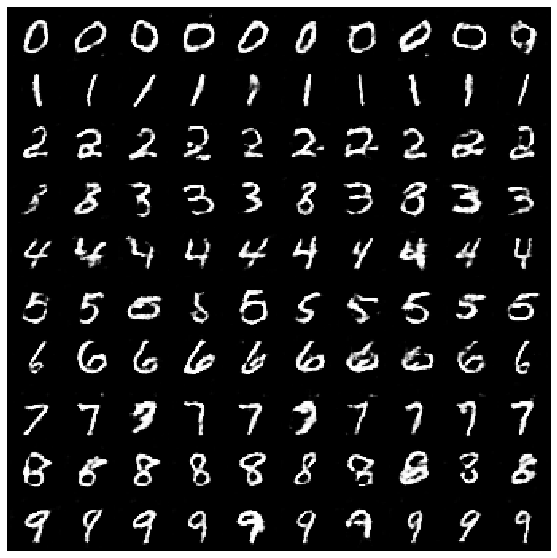

[ 1925/ 7812]	Loss_D: 1.0786	Loss_G: 0.8592	D(x): 0.5410	D(G(z)): 0.3124
[ 1950/ 7812]	Loss_D: 1.2335	Loss_G: 0.8845	D(x): 0.5006	D(G(z)): 0.3270
[ 1975/ 7812]	Loss_D: 1.3450	Loss_G: 1.8970	D(x): 0.7997	D(G(z)): 0.6239
[ 2000/ 7812]	Loss_D: 1.1495	Loss_G: 0.8404	D(x): 0.5448	D(G(z)): 0.3290


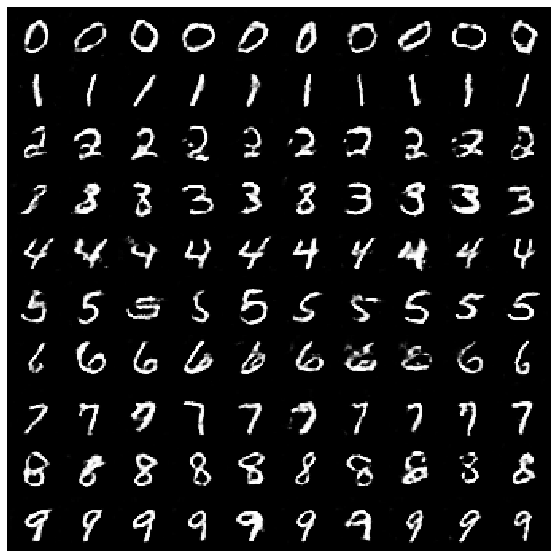

[ 2025/ 7812]	Loss_D: 1.3781	Loss_G: 1.9659	D(x): 0.7426	D(G(z)): 0.5893
[ 2050/ 7812]	Loss_D: 1.2473	Loss_G: 1.2505	D(x): 0.5962	D(G(z)): 0.4449
[ 2075/ 7812]	Loss_D: 1.1791	Loss_G: 0.7383	D(x): 0.5272	D(G(z)): 0.3527
[ 2100/ 7812]	Loss_D: 1.3770	Loss_G: 1.3303	D(x): 0.7252	D(G(z)): 0.6018


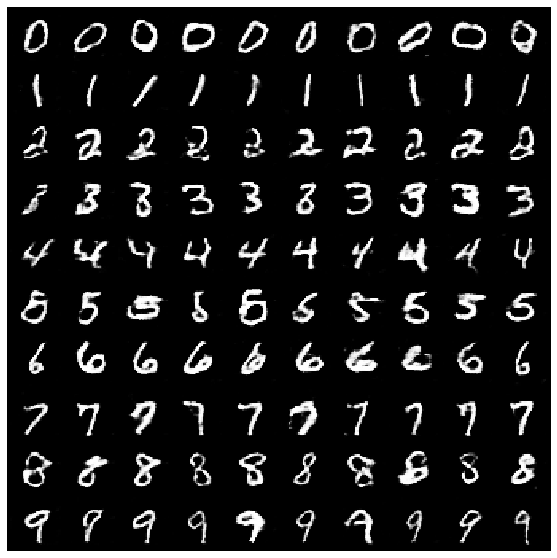

[ 2125/ 7812]	Loss_D: 1.3170	Loss_G: 0.7355	D(x): 0.3966	D(G(z)): 0.2174
[ 2150/ 7812]	Loss_D: 1.0946	Loss_G: 1.1456	D(x): 0.5266	D(G(z)): 0.2961
[ 2175/ 7812]	Loss_D: 1.3005	Loss_G: 0.8389	D(x): 0.4535	D(G(z)): 0.3003
[ 2200/ 7812]	Loss_D: 1.2312	Loss_G: 0.8789	D(x): 0.4989	D(G(z)): 0.3418


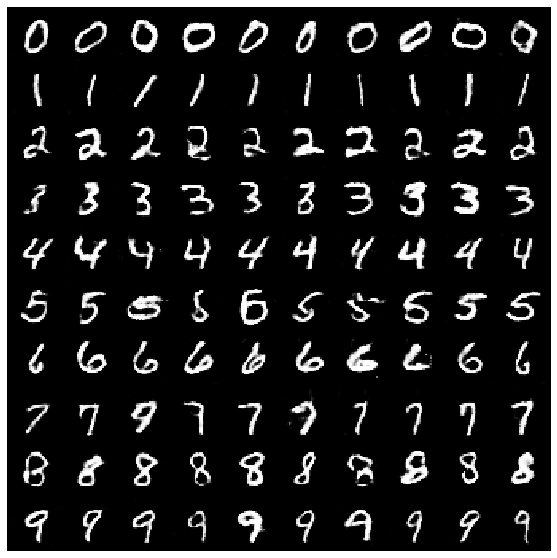

[ 2225/ 7812]	Loss_D: 1.2005	Loss_G: 0.8701	D(x): 0.4890	D(G(z)): 0.3038
[ 2250/ 7812]	Loss_D: 1.2195	Loss_G: 0.6854	D(x): 0.4644	D(G(z)): 0.2486
[ 2275/ 7812]	Loss_D: 1.0738	Loss_G: 1.2822	D(x): 0.6443	D(G(z)): 0.4097
[ 2300/ 7812]	Loss_D: 1.1530	Loss_G: 1.6192	D(x): 0.7359	D(G(z)): 0.5293


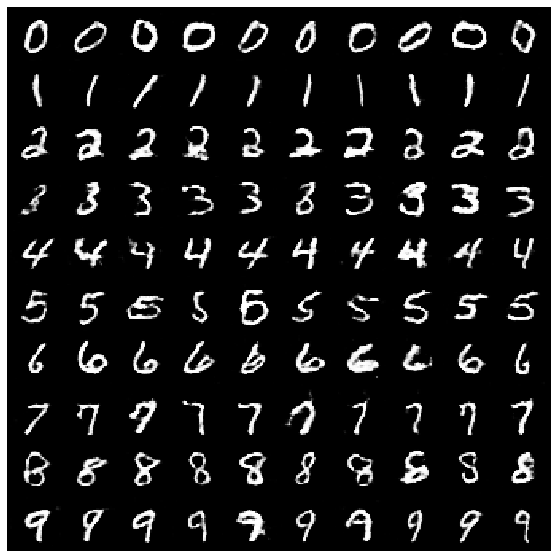

[ 2325/ 7812]	Loss_D: 1.1714	Loss_G: 1.2287	D(x): 0.5131	D(G(z)): 0.3284
[ 2350/ 7812]	Loss_D: 1.2494	Loss_G: 0.8417	D(x): 0.5141	D(G(z)): 0.3761
[ 2375/ 7812]	Loss_D: 1.1425	Loss_G: 0.9189	D(x): 0.5211	D(G(z)): 0.3144
[ 2400/ 7812]	Loss_D: 1.2840	Loss_G: 0.6290	D(x): 0.4796	D(G(z)): 0.3340


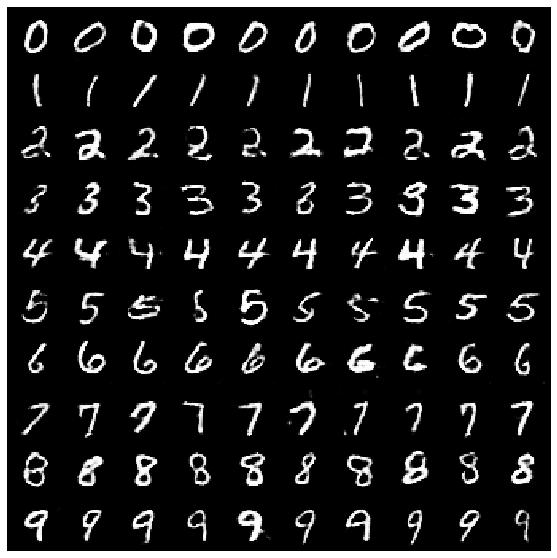

[ 2425/ 7812]	Loss_D: 1.0996	Loss_G: 1.3932	D(x): 0.6686	D(G(z)): 0.4495
[ 2450/ 7812]	Loss_D: 1.2513	Loss_G: 0.7534	D(x): 0.4698	D(G(z)): 0.3057
[ 2475/ 7812]	Loss_D: 1.1406	Loss_G: 1.3782	D(x): 0.6619	D(G(z)): 0.4685
[ 2500/ 7812]	Loss_D: 1.3368	Loss_G: 0.8165	D(x): 0.3633	D(G(z)): 0.1689


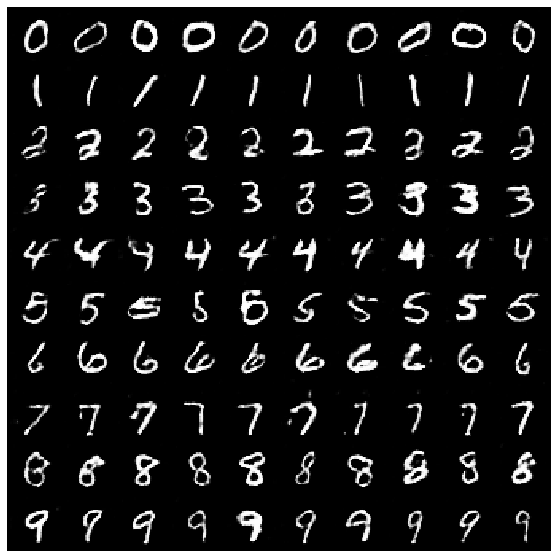

[ 2525/ 7812]	Loss_D: 1.1397	Loss_G: 1.2427	D(x): 0.6690	D(G(z)): 0.4711
[ 2550/ 7812]	Loss_D: 1.3147	Loss_G: 1.0565	D(x): 0.4764	D(G(z)): 0.3600
[ 2575/ 7812]	Loss_D: 1.3554	Loss_G: 1.4546	D(x): 0.6446	D(G(z)): 0.5442
[ 2600/ 7812]	Loss_D: 1.0443	Loss_G: 1.1332	D(x): 0.5676	D(G(z)): 0.3181


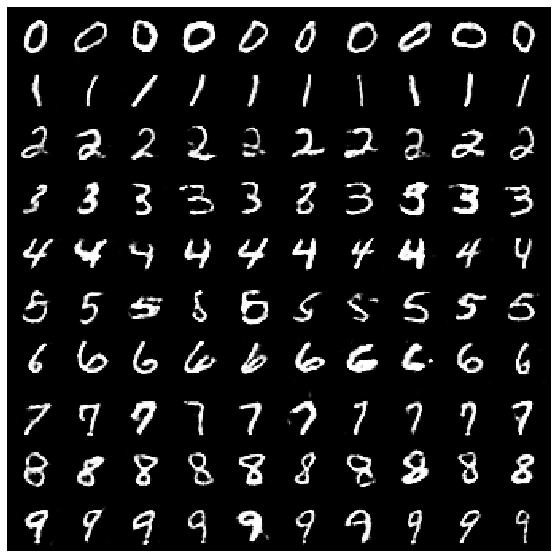

[ 2625/ 7812]	Loss_D: 1.4624	Loss_G: 0.5612	D(x): 0.3175	D(G(z)): 0.1677
[ 2650/ 7812]	Loss_D: 1.0746	Loss_G: 1.1727	D(x): 0.6083	D(G(z)): 0.3781
[ 2675/ 7812]	Loss_D: 1.1699	Loss_G: 1.1656	D(x): 0.5494	D(G(z)): 0.3735
[ 2700/ 7812]	Loss_D: 1.1378	Loss_G: 0.9539	D(x): 0.5209	D(G(z)): 0.3252


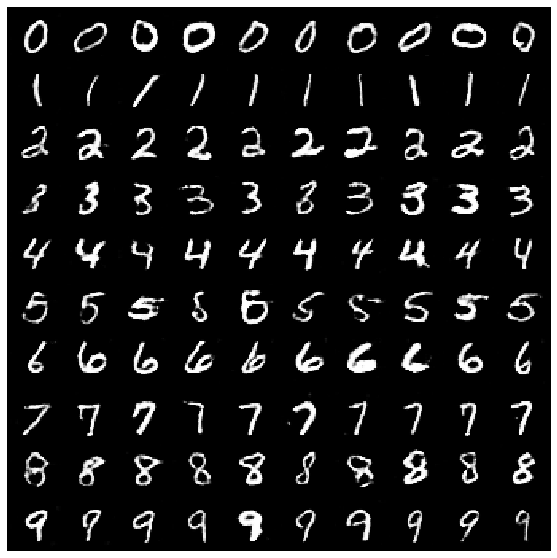

[ 2725/ 7812]	Loss_D: 1.1761	Loss_G: 0.8528	D(x): 0.5348	D(G(z)): 0.3664
[ 2750/ 7812]	Loss_D: 1.1897	Loss_G: 1.0582	D(x): 0.5934	D(G(z)): 0.4346
[ 2775/ 7812]	Loss_D: 1.3588	Loss_G: 0.7765	D(x): 0.3939	D(G(z)): 0.2608
[ 2800/ 7812]	Loss_D: 1.1895	Loss_G: 1.1738	D(x): 0.5909	D(G(z)): 0.4222


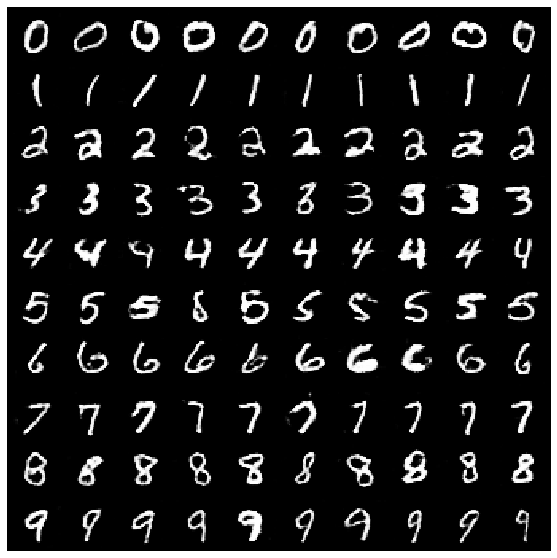

[ 2825/ 7812]	Loss_D: 1.0967	Loss_G: 1.1052	D(x): 0.5767	D(G(z)): 0.3630
[ 2850/ 7812]	Loss_D: 1.2366	Loss_G: 1.5903	D(x): 0.6977	D(G(z)): 0.5273
[ 2875/ 7812]	Loss_D: 1.2423	Loss_G: 0.7054	D(x): 0.4701	D(G(z)): 0.3013
[ 2900/ 7812]	Loss_D: 1.1826	Loss_G: 1.0222	D(x): 0.6069	D(G(z)): 0.4408


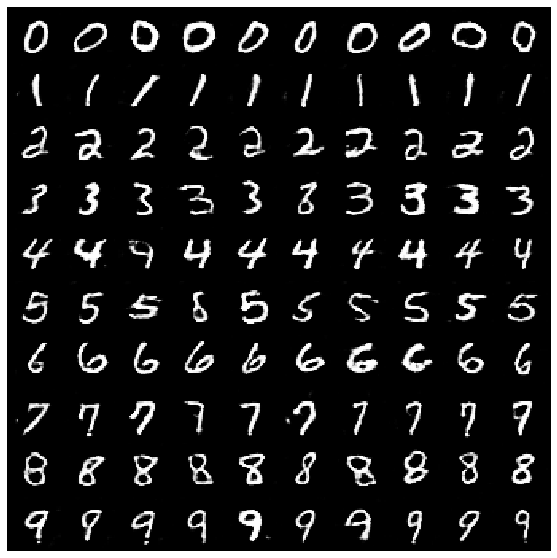

[ 2925/ 7812]	Loss_D: 1.2602	Loss_G: 1.1021	D(x): 0.5505	D(G(z)): 0.4145
[ 2950/ 7812]	Loss_D: 1.1252	Loss_G: 0.7343	D(x): 0.4978	D(G(z)): 0.3003
[ 2975/ 7812]	Loss_D: 1.1724	Loss_G: 0.9303	D(x): 0.6153	D(G(z)): 0.4411
[ 3000/ 7812]	Loss_D: 1.1699	Loss_G: 0.5901	D(x): 0.4992	D(G(z)): 0.3215


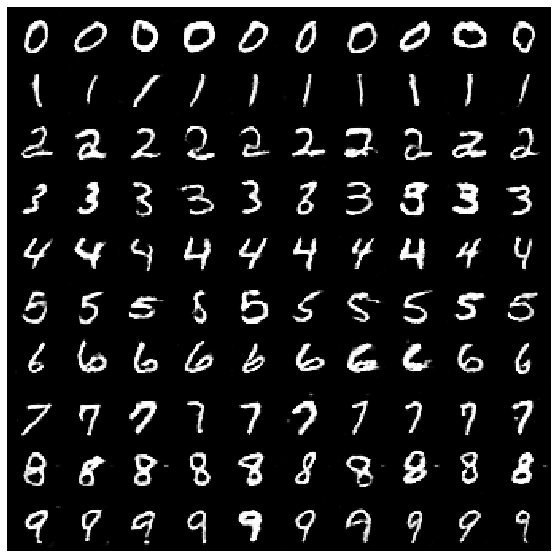

[ 3025/ 7812]	Loss_D: 1.0786	Loss_G: 1.0671	D(x): 0.6716	D(G(z)): 0.4541
[ 3050/ 7812]	Loss_D: 1.1430	Loss_G: 1.3491	D(x): 0.6517	D(G(z)): 0.4676
[ 3075/ 7812]	Loss_D: 1.2626	Loss_G: 1.6748	D(x): 0.7287	D(G(z)): 0.5787
[ 3100/ 7812]	Loss_D: 1.2549	Loss_G: 1.1854	D(x): 0.6247	D(G(z)): 0.4857


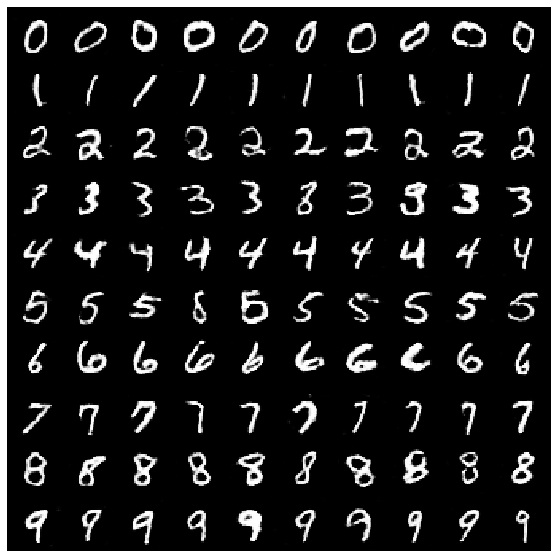

[ 3125/ 7812]	Loss_D: 1.1649	Loss_G: 0.8627	D(x): 0.5286	D(G(z)): 0.3673
[ 3150/ 7812]	Loss_D: 1.1997	Loss_G: 1.3594	D(x): 0.6766	D(G(z)): 0.5102
[ 3175/ 7812]	Loss_D: 1.1632	Loss_G: 0.8004	D(x): 0.5748	D(G(z)): 0.4048
[ 3200/ 7812]	Loss_D: 1.1834	Loss_G: 1.0166	D(x): 0.6129	D(G(z)): 0.4535


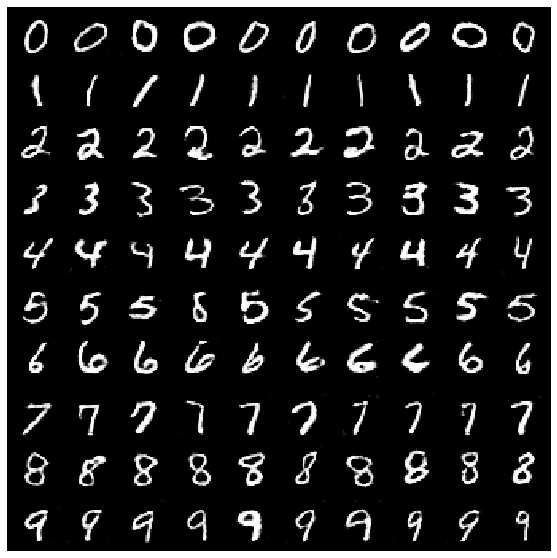

[ 3225/ 7812]	Loss_D: 1.2115	Loss_G: 1.2956	D(x): 0.6762	D(G(z)): 0.5194
[ 3250/ 7812]	Loss_D: 1.1983	Loss_G: 1.4378	D(x): 0.6829	D(G(z)): 0.5096
[ 3275/ 7812]	Loss_D: 1.2213	Loss_G: 0.6380	D(x): 0.4639	D(G(z)): 0.2978
[ 3300/ 7812]	Loss_D: 1.3136	Loss_G: 1.3409	D(x): 0.7375	D(G(z)): 0.5891


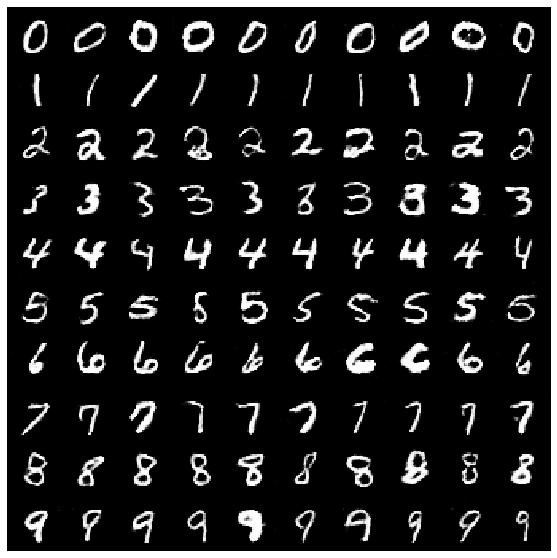

[ 3325/ 7812]	Loss_D: 1.3014	Loss_G: 1.5754	D(x): 0.6651	D(G(z)): 0.5451
[ 3350/ 7812]	Loss_D: 1.1809	Loss_G: 0.8787	D(x): 0.5434	D(G(z)): 0.3728
[ 3375/ 7812]	Loss_D: 1.1899	Loss_G: 0.9739	D(x): 0.5685	D(G(z)): 0.4091
[ 3400/ 7812]	Loss_D: 1.2230	Loss_G: 1.0929	D(x): 0.5944	D(G(z)): 0.4619


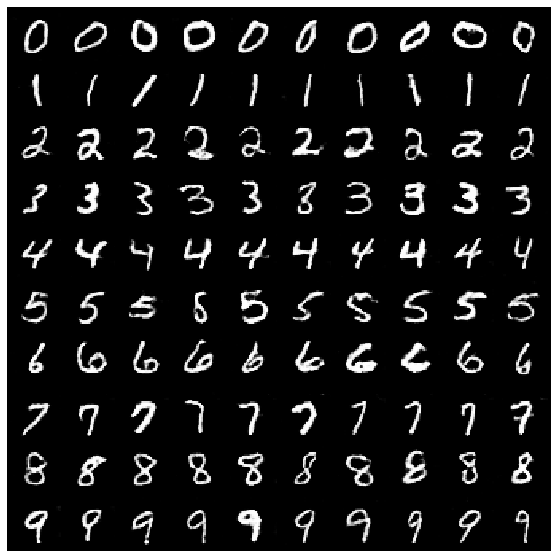

[ 3425/ 7812]	Loss_D: 1.3140	Loss_G: 1.2419	D(x): 0.6002	D(G(z)): 0.5067
[ 3450/ 7812]	Loss_D: 1.1638	Loss_G: 1.0514	D(x): 0.6046	D(G(z)): 0.4422
[ 3475/ 7812]	Loss_D: 1.2224	Loss_G: 1.2367	D(x): 0.5427	D(G(z)): 0.4066
[ 3500/ 7812]	Loss_D: 1.1894	Loss_G: 0.9868	D(x): 0.5528	D(G(z)): 0.3980


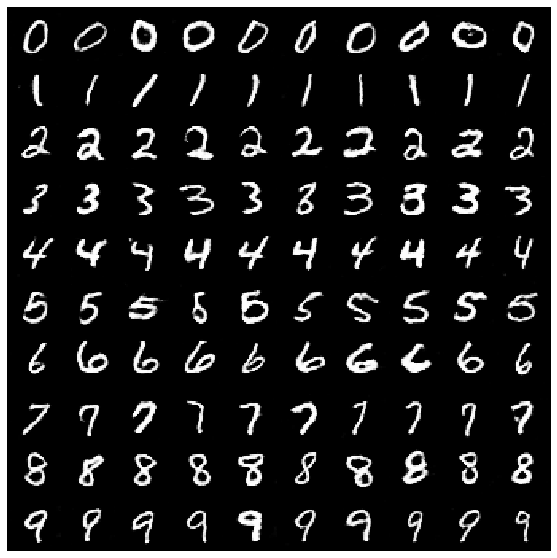

[ 3525/ 7812]	Loss_D: 1.1528	Loss_G: 0.9052	D(x): 0.5114	D(G(z)): 0.3397
[ 3550/ 7812]	Loss_D: 1.1967	Loss_G: 0.7906	D(x): 0.5091	D(G(z)): 0.3522
[ 3575/ 7812]	Loss_D: 1.4423	Loss_G: 0.8943	D(x): 0.3685	D(G(z)): 0.2571
[ 3600/ 7812]	Loss_D: 1.2437	Loss_G: 0.8834	D(x): 0.5152	D(G(z)): 0.3781


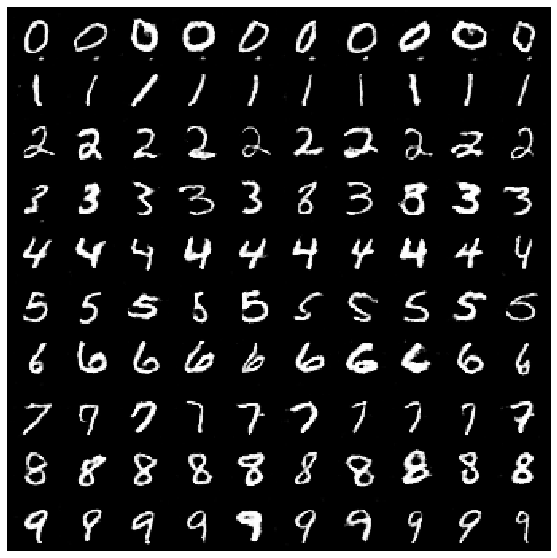

[ 3625/ 7812]	Loss_D: 1.1198	Loss_G: 0.7756	D(x): 0.5396	D(G(z)): 0.3546
[ 3650/ 7812]	Loss_D: 1.2364	Loss_G: 1.0892	D(x): 0.5548	D(G(z)): 0.4233
[ 3675/ 7812]	Loss_D: 1.2314	Loss_G: 1.5219	D(x): 0.6914	D(G(z)): 0.5405
[ 3700/ 7812]	Loss_D: 1.2351	Loss_G: 0.7965	D(x): 0.4846	D(G(z)): 0.3531


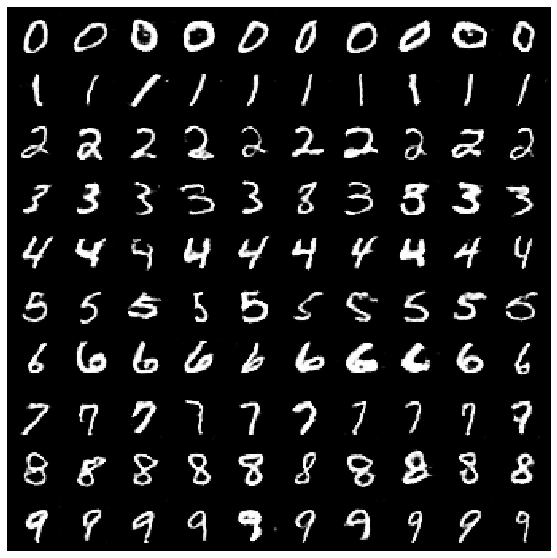

[ 3725/ 7812]	Loss_D: 1.1904	Loss_G: 0.8132	D(x): 0.4928	D(G(z)): 0.3362
[ 3750/ 7812]	Loss_D: 1.2180	Loss_G: 1.2782	D(x): 0.6935	D(G(z)): 0.5427
[ 3775/ 7812]	Loss_D: 1.1691	Loss_G: 1.3441	D(x): 0.5025	D(G(z)): 0.3287
[ 3800/ 7812]	Loss_D: 1.0975	Loss_G: 0.7685	D(x): 0.5343	D(G(z)): 0.3217


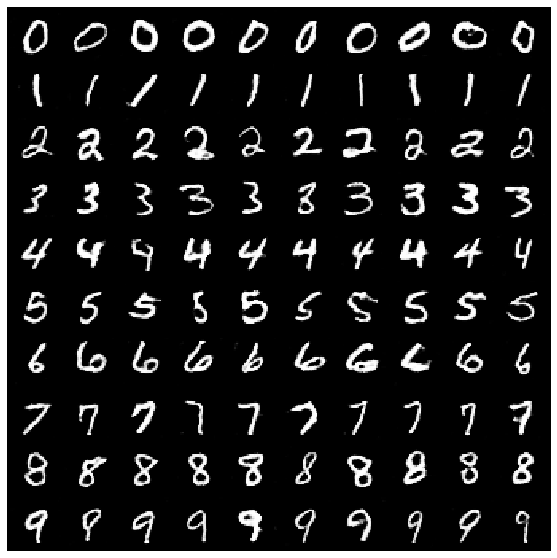

[ 3825/ 7812]	Loss_D: 1.1226	Loss_G: 0.8103	D(x): 0.5225	D(G(z)): 0.3238
[ 3850/ 7812]	Loss_D: 1.0869	Loss_G: 1.4229	D(x): 0.6651	D(G(z)): 0.4542
[ 3875/ 7812]	Loss_D: 1.1914	Loss_G: 1.0351	D(x): 0.5522	D(G(z)): 0.4070
[ 3900/ 7812]	Loss_D: 1.2317	Loss_G: 1.0972	D(x): 0.6062	D(G(z)): 0.4699


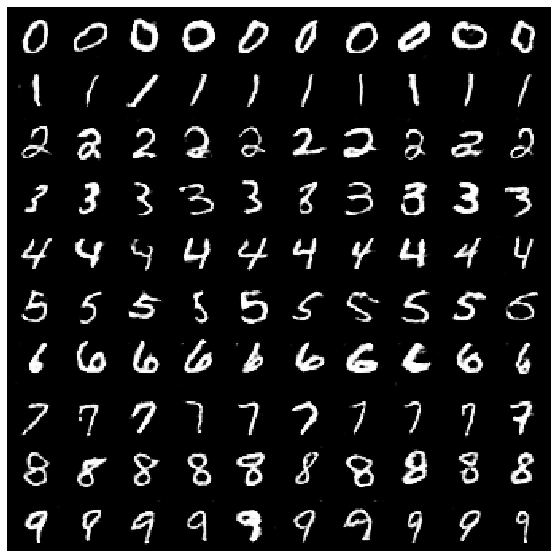

[ 3925/ 7812]	Loss_D: 1.2099	Loss_G: 1.2253	D(x): 0.6506	D(G(z)): 0.4894
[ 3950/ 7812]	Loss_D: 1.1831	Loss_G: 0.8741	D(x): 0.5279	D(G(z)): 0.3666
[ 3975/ 7812]	Loss_D: 1.3330	Loss_G: 0.9454	D(x): 0.4921	D(G(z)): 0.4163
[ 4000/ 7812]	Loss_D: 1.2418	Loss_G: 1.7952	D(x): 0.6958	D(G(z)): 0.5422


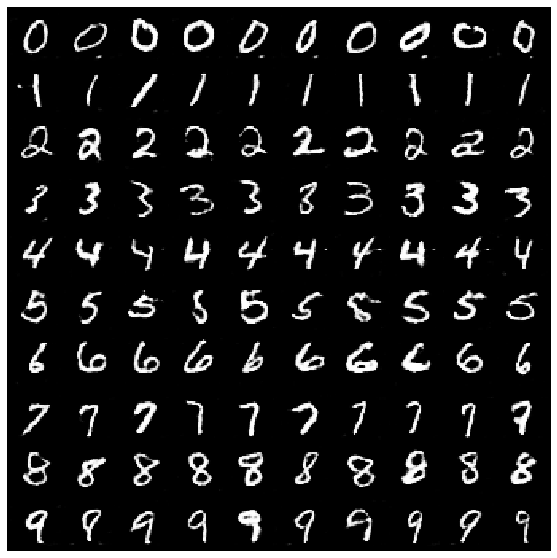

[ 4025/ 7812]	Loss_D: 1.2442	Loss_G: 0.8510	D(x): 0.5055	D(G(z)): 0.3871
[ 4050/ 7812]	Loss_D: 1.2265	Loss_G: 0.9940	D(x): 0.5325	D(G(z)): 0.4022
[ 4075/ 7812]	Loss_D: 1.2788	Loss_G: 1.1751	D(x): 0.6656	D(G(z)): 0.5469
[ 4100/ 7812]	Loss_D: 1.2506	Loss_G: 1.1693	D(x): 0.6828	D(G(z)): 0.5495


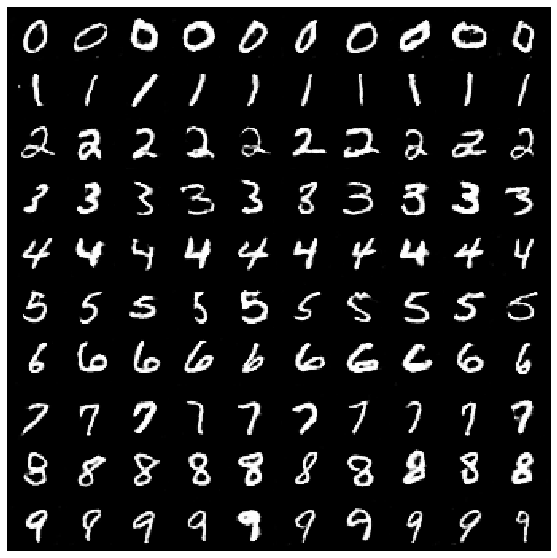

[ 4125/ 7812]	Loss_D: 1.2327	Loss_G: 1.1865	D(x): 0.5810	D(G(z)): 0.4630
[ 4150/ 7812]	Loss_D: 1.1463	Loss_G: 0.8390	D(x): 0.5725	D(G(z)): 0.4079
[ 4175/ 7812]	Loss_D: 1.7373	Loss_G: 1.7400	D(x): 0.8839	D(G(z)): 0.7633
[ 4200/ 7812]	Loss_D: 1.3801	Loss_G: 0.2848	D(x): 0.3426	D(G(z)): 0.2002


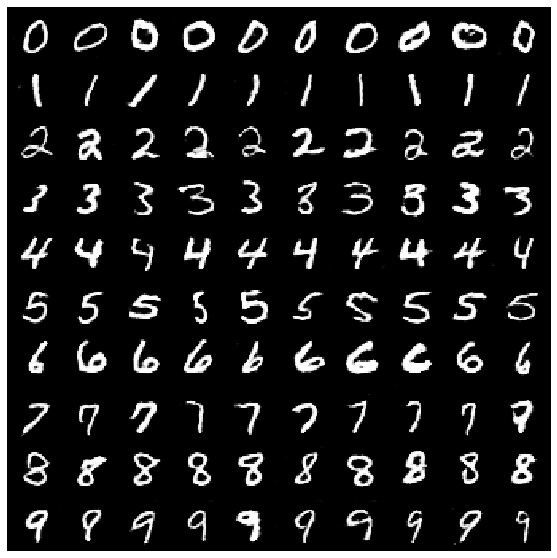

[ 4225/ 7812]	Loss_D: 1.1055	Loss_G: 1.0842	D(x): 0.5782	D(G(z)): 0.3760
[ 4250/ 7812]	Loss_D: 1.2205	Loss_G: 0.8453	D(x): 0.5822	D(G(z)): 0.4499
[ 4275/ 7812]	Loss_D: 1.1518	Loss_G: 0.9638	D(x): 0.5577	D(G(z)): 0.3940
learning rate change!
[ 4300/ 7812]	Loss_D: 1.1228	Loss_G: 0.9002	D(x): 0.5815	D(G(z)): 0.4011


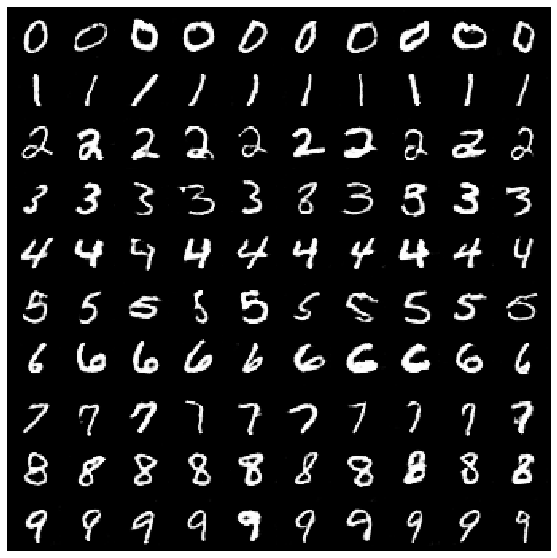

[ 4325/ 7812]	Loss_D: 1.0820	Loss_G: 0.9642	D(x): 0.6317	D(G(z)): 0.4375
[ 4350/ 7812]	Loss_D: 1.1990	Loss_G: 0.8777	D(x): 0.5465	D(G(z)): 0.4152
[ 4375/ 7812]	Loss_D: 1.0610	Loss_G: 0.8300	D(x): 0.5968	D(G(z)): 0.3892
[ 4400/ 7812]	Loss_D: 1.1216	Loss_G: 0.8751	D(x): 0.5699	D(G(z)): 0.4045


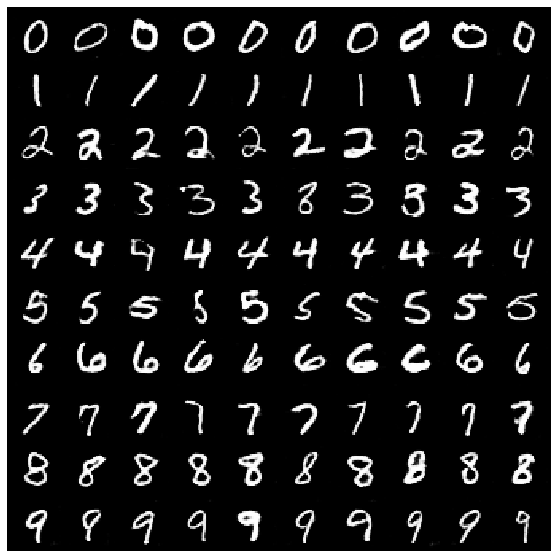

[ 4425/ 7812]	Loss_D: 1.1478	Loss_G: 0.8408	D(x): 0.5625	D(G(z)): 0.4116
[ 4450/ 7812]	Loss_D: 1.1267	Loss_G: 0.8677	D(x): 0.5951	D(G(z)): 0.4281
[ 4475/ 7812]	Loss_D: 1.0943	Loss_G: 0.9479	D(x): 0.5901	D(G(z)): 0.4107
[ 4500/ 7812]	Loss_D: 1.1601	Loss_G: 0.9630	D(x): 0.5832	D(G(z)): 0.4358


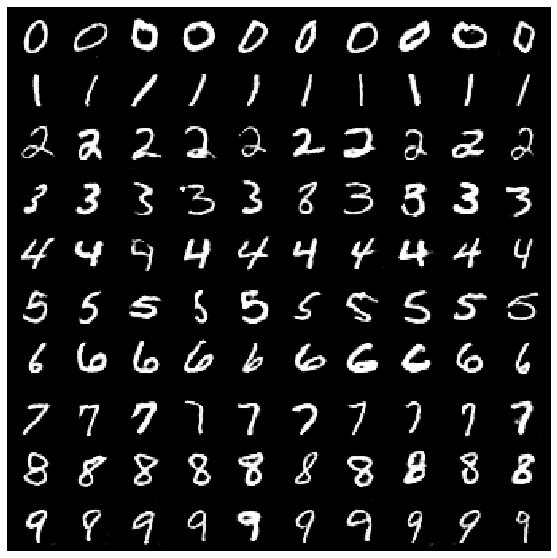

[ 4525/ 7812]	Loss_D: 1.1866	Loss_G: 0.9766	D(x): 0.5566	D(G(z)): 0.4251
[ 4550/ 7812]	Loss_D: 1.1487	Loss_G: 0.8205	D(x): 0.5940	D(G(z)): 0.4408
[ 4575/ 7812]	Loss_D: 1.1284	Loss_G: 0.9414	D(x): 0.5719	D(G(z)): 0.4094
[ 4600/ 7812]	Loss_D: 1.0627	Loss_G: 0.8975	D(x): 0.5920	D(G(z)): 0.3960


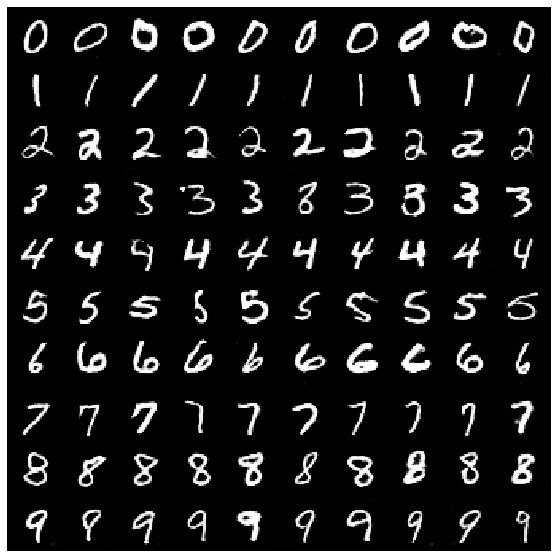

[ 4625/ 7812]	Loss_D: 1.1034	Loss_G: 0.8852	D(x): 0.5863	D(G(z)): 0.4118
[ 4650/ 7812]	Loss_D: 1.0343	Loss_G: 0.9642	D(x): 0.6373	D(G(z)): 0.4234
[ 4675/ 7812]	Loss_D: 1.1416	Loss_G: 0.9459	D(x): 0.5707	D(G(z)): 0.4185
[ 4700/ 7812]	Loss_D: 1.1161	Loss_G: 0.9710	D(x): 0.5764	D(G(z)): 0.4097


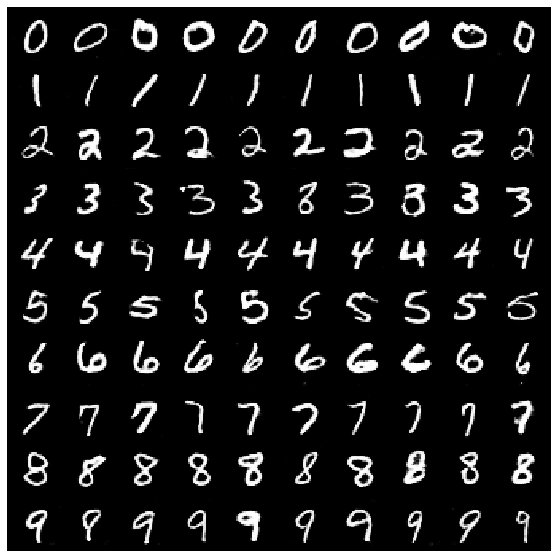

[ 4725/ 7812]	Loss_D: 1.0617	Loss_G: 0.8804	D(x): 0.5922	D(G(z)): 0.3910
[ 4750/ 7812]	Loss_D: 1.0691	Loss_G: 0.8586	D(x): 0.5859	D(G(z)): 0.3920
[ 4775/ 7812]	Loss_D: 1.1028	Loss_G: 0.9095	D(x): 0.5816	D(G(z)): 0.4034
[ 4800/ 7812]	Loss_D: 1.1519	Loss_G: 1.0230	D(x): 0.5955	D(G(z)): 0.4499


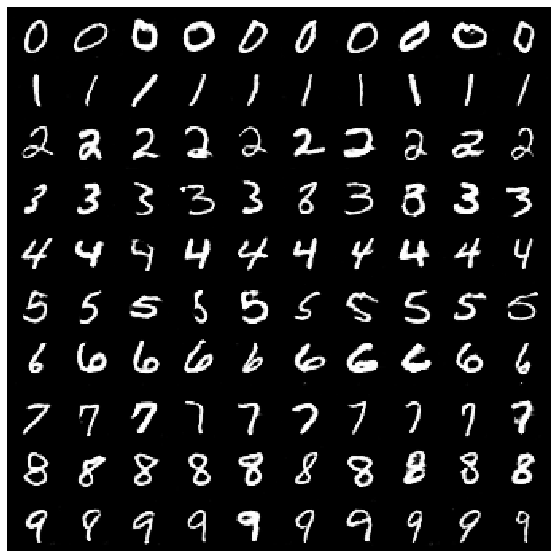

[ 4825/ 7812]	Loss_D: 1.1136	Loss_G: 0.9374	D(x): 0.5778	D(G(z)): 0.4080
[ 4850/ 7812]	Loss_D: 1.1363	Loss_G: 0.8253	D(x): 0.5684	D(G(z)): 0.4081
[ 4875/ 7812]	Loss_D: 1.0947	Loss_G: 0.9409	D(x): 0.5596	D(G(z)): 0.3761
[ 4900/ 7812]	Loss_D: 1.0658	Loss_G: 0.9261	D(x): 0.6311	D(G(z)): 0.4346


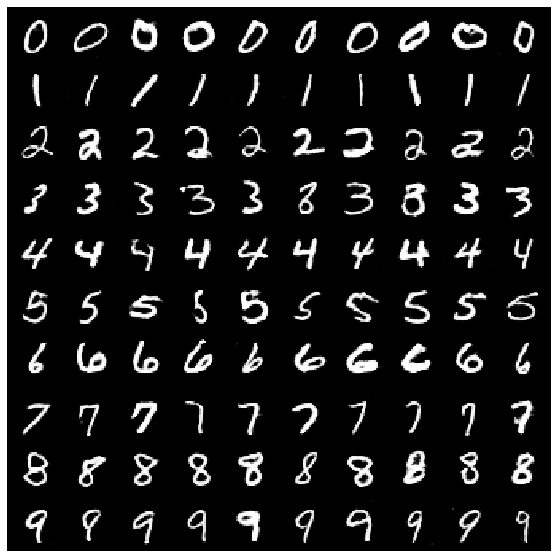

[ 4925/ 7812]	Loss_D: 1.1369	Loss_G: 0.9360	D(x): 0.5641	D(G(z)): 0.4077
[ 4950/ 7812]	Loss_D: 1.0633	Loss_G: 0.9312	D(x): 0.5793	D(G(z)): 0.3792
[ 4975/ 7812]	Loss_D: 1.0788	Loss_G: 0.9846	D(x): 0.5715	D(G(z)): 0.3825
[ 5000/ 7812]	Loss_D: 1.0760	Loss_G: 0.9366	D(x): 0.5781	D(G(z)): 0.3874


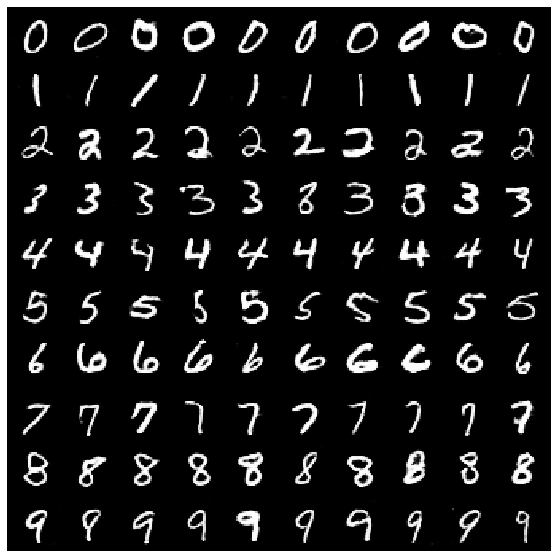

[ 5025/ 7812]	Loss_D: 1.0372	Loss_G: 1.0315	D(x): 0.6379	D(G(z)): 0.4216
[ 5050/ 7812]	Loss_D: 1.1106	Loss_G: 0.8624	D(x): 0.6010	D(G(z)): 0.4259
[ 5075/ 7812]	Loss_D: 1.1088	Loss_G: 0.9479	D(x): 0.5619	D(G(z)): 0.3881
[ 5100/ 7812]	Loss_D: 0.9646	Loss_G: 1.1079	D(x): 0.6417	D(G(z)): 0.3871


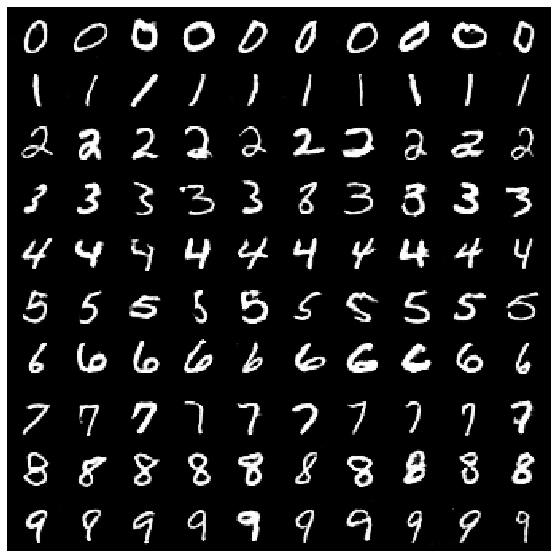

[ 5125/ 7812]	Loss_D: 1.1197	Loss_G: 0.8798	D(x): 0.5782	D(G(z)): 0.4140
[ 5150/ 7812]	Loss_D: 1.0723	Loss_G: 0.9288	D(x): 0.5885	D(G(z)): 0.3940
[ 5175/ 7812]	Loss_D: 1.1419	Loss_G: 0.9696	D(x): 0.5912	D(G(z)): 0.4340
[ 5200/ 7812]	Loss_D: 1.0677	Loss_G: 1.0221	D(x): 0.6092	D(G(z)): 0.4121


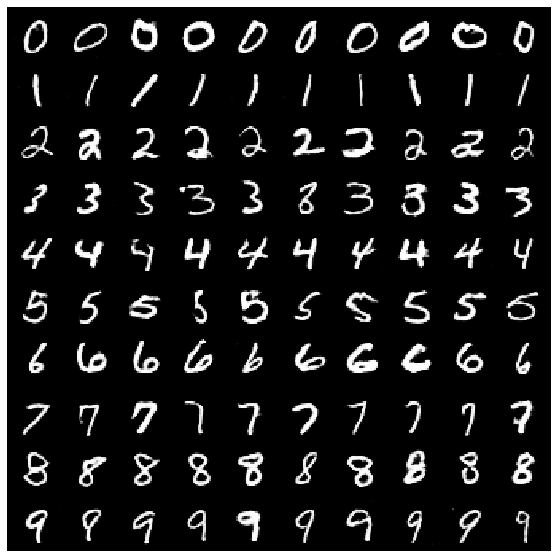

[ 5225/ 7812]	Loss_D: 1.0858	Loss_G: 0.9913	D(x): 0.5781	D(G(z)): 0.3940
[ 5250/ 7812]	Loss_D: 1.0803	Loss_G: 0.9607	D(x): 0.5657	D(G(z)): 0.3755
[ 5275/ 7812]	Loss_D: 1.0078	Loss_G: 0.9093	D(x): 0.6053	D(G(z)): 0.3706
[ 5300/ 7812]	Loss_D: 1.1451	Loss_G: 0.8113	D(x): 0.5739	D(G(z)): 0.4237


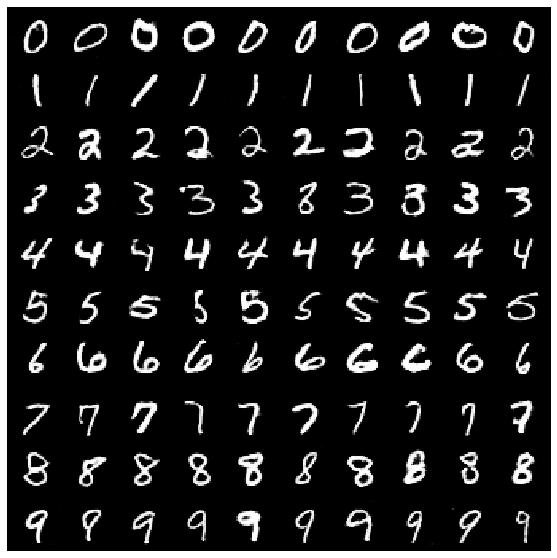

[ 5325/ 7812]	Loss_D: 1.1245	Loss_G: 0.9828	D(x): 0.5671	D(G(z)): 0.4009
[ 5350/ 7812]	Loss_D: 1.0772	Loss_G: 0.9064	D(x): 0.5662	D(G(z)): 0.3716
[ 5375/ 7812]	Loss_D: 1.0529	Loss_G: 0.9615	D(x): 0.6134	D(G(z)): 0.4079
[ 5400/ 7812]	Loss_D: 1.1984	Loss_G: 0.9146	D(x): 0.5316	D(G(z)): 0.4025


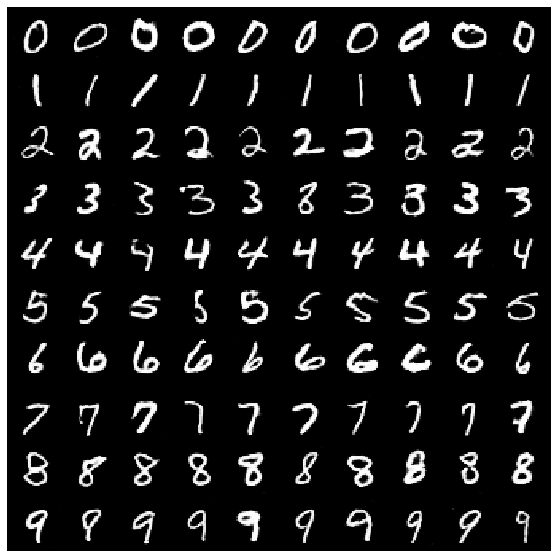

[ 5425/ 7812]	Loss_D: 1.0285	Loss_G: 0.9956	D(x): 0.6243	D(G(z)): 0.4052
[ 5450/ 7812]	Loss_D: 1.0770	Loss_G: 0.8882	D(x): 0.5896	D(G(z)): 0.3974
[ 5475/ 7812]	Loss_D: 1.1264	Loss_G: 1.0180	D(x): 0.5855	D(G(z)): 0.4211
[ 5500/ 7812]	Loss_D: 1.0128	Loss_G: 0.9946	D(x): 0.6216	D(G(z)): 0.3949


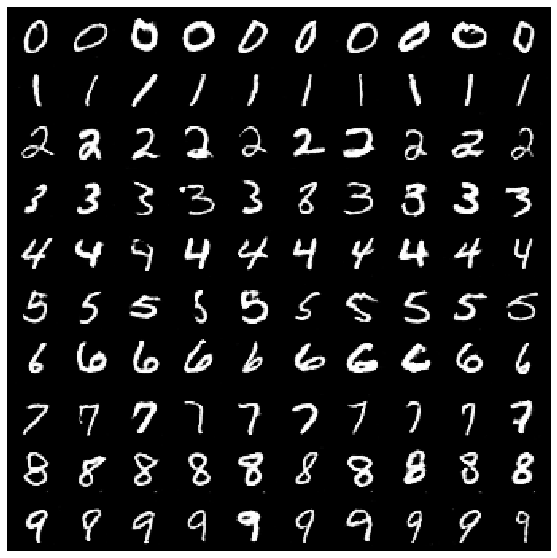

[ 5525/ 7812]	Loss_D: 1.0221	Loss_G: 0.9379	D(x): 0.6436	D(G(z)): 0.4218
[ 5550/ 7812]	Loss_D: 1.0643	Loss_G: 0.9590	D(x): 0.6366	D(G(z)): 0.4340
[ 5575/ 7812]	Loss_D: 1.1284	Loss_G: 0.9058	D(x): 0.5801	D(G(z)): 0.4172
[ 5600/ 7812]	Loss_D: 1.0351	Loss_G: 0.9476	D(x): 0.6014	D(G(z)): 0.3860


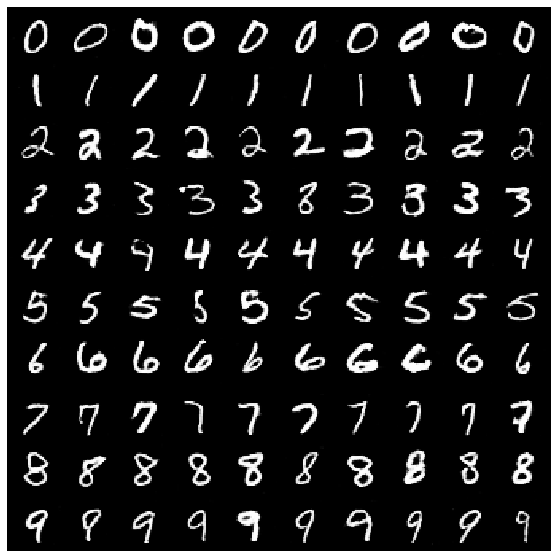

[ 5625/ 7812]	Loss_D: 1.1468	Loss_G: 0.9504	D(x): 0.5763	D(G(z)): 0.4249
[ 5650/ 7812]	Loss_D: 1.0141	Loss_G: 1.0246	D(x): 0.6201	D(G(z)): 0.3930
[ 5675/ 7812]	Loss_D: 1.0584	Loss_G: 0.8847	D(x): 0.5710	D(G(z)): 0.3687
[ 5700/ 7812]	Loss_D: 1.0956	Loss_G: 0.9923	D(x): 0.5586	D(G(z)): 0.3712


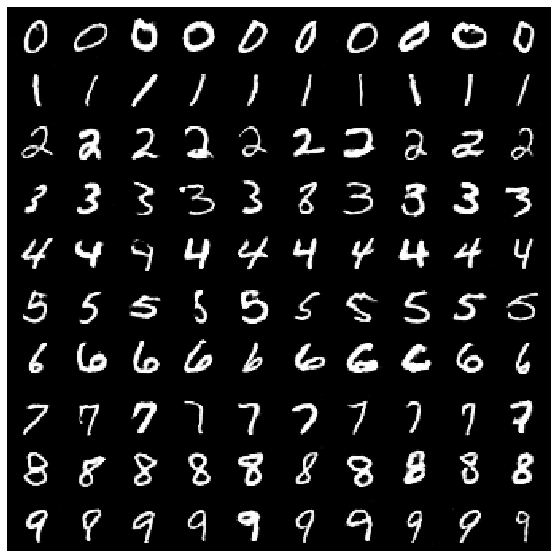

[ 5725/ 7812]	Loss_D: 1.0877	Loss_G: 0.8309	D(x): 0.5821	D(G(z)): 0.3985
[ 5750/ 7812]	Loss_D: 1.1595	Loss_G: 0.9182	D(x): 0.5360	D(G(z)): 0.3827
[ 5775/ 7812]	Loss_D: 1.1141	Loss_G: 0.9641	D(x): 0.5756	D(G(z)): 0.4008
[ 5800/ 7812]	Loss_D: 1.0990	Loss_G: 1.0441	D(x): 0.5539	D(G(z)): 0.3663


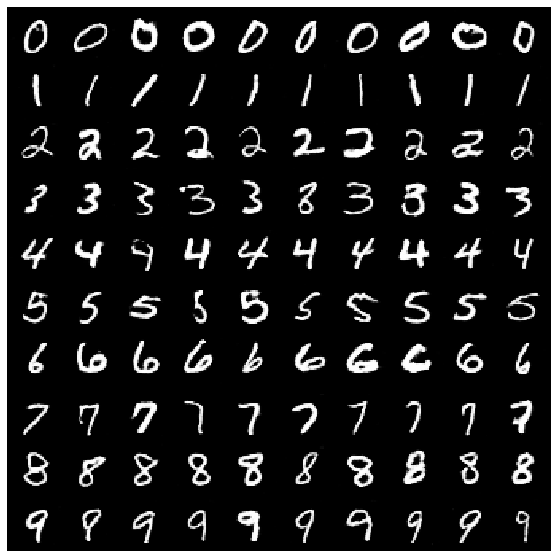

[ 5825/ 7812]	Loss_D: 1.0712	Loss_G: 0.9305	D(x): 0.5960	D(G(z)): 0.3976
[ 5850/ 7812]	Loss_D: 1.0779	Loss_G: 1.0246	D(x): 0.6193	D(G(z)): 0.4239
[ 5875/ 7812]	Loss_D: 1.0288	Loss_G: 0.9384	D(x): 0.6087	D(G(z)): 0.3916
[ 5900/ 7812]	Loss_D: 1.0889	Loss_G: 1.0696	D(x): 0.5890	D(G(z)): 0.3969


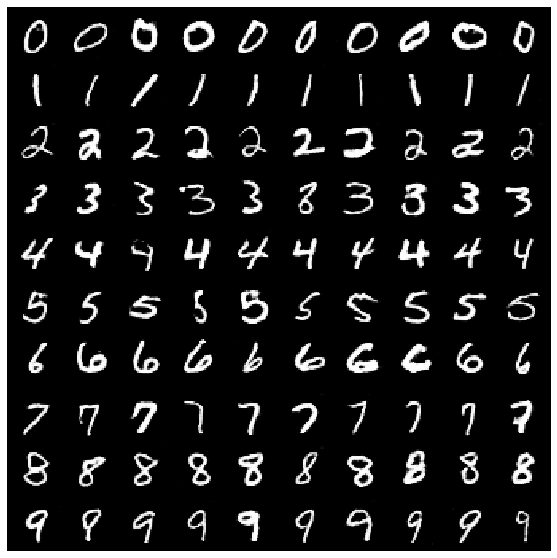

[ 5925/ 7812]	Loss_D: 1.0508	Loss_G: 0.9542	D(x): 0.6036	D(G(z)): 0.3943
[ 5950/ 7812]	Loss_D: 1.0938	Loss_G: 1.0052	D(x): 0.6173	D(G(z)): 0.4292
[ 5975/ 7812]	Loss_D: 1.1382	Loss_G: 0.9370	D(x): 0.5824	D(G(z)): 0.4214
[ 6000/ 7812]	Loss_D: 1.0320	Loss_G: 1.0007	D(x): 0.6482	D(G(z)): 0.4224


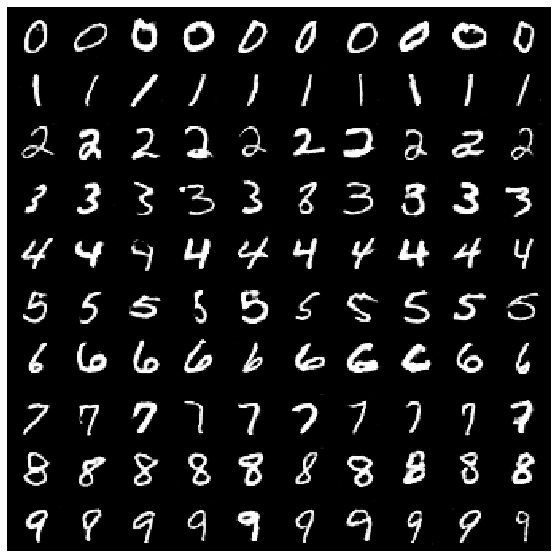

[ 6025/ 7812]	Loss_D: 1.0764	Loss_G: 0.9498	D(x): 0.5796	D(G(z)): 0.3797
[ 6050/ 7812]	Loss_D: 1.0455	Loss_G: 0.9537	D(x): 0.6208	D(G(z)): 0.4069
[ 6075/ 7812]	Loss_D: 1.0198	Loss_G: 0.9920	D(x): 0.5975	D(G(z)): 0.3691
[ 6100/ 7812]	Loss_D: 1.0179	Loss_G: 1.0415	D(x): 0.6007	D(G(z)): 0.3723


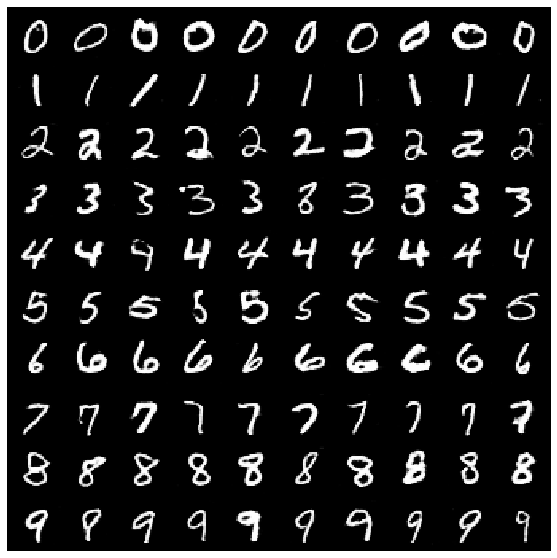

[ 6125/ 7812]	Loss_D: 1.1106	Loss_G: 0.9500	D(x): 0.5896	D(G(z)): 0.4122
[ 6150/ 7812]	Loss_D: 1.0619	Loss_G: 0.9423	D(x): 0.5865	D(G(z)): 0.3806
[ 6175/ 7812]	Loss_D: 1.0151	Loss_G: 1.1407	D(x): 0.6452	D(G(z)): 0.4107
[ 6200/ 7812]	Loss_D: 1.0961	Loss_G: 0.9494	D(x): 0.5642	D(G(z)): 0.3791


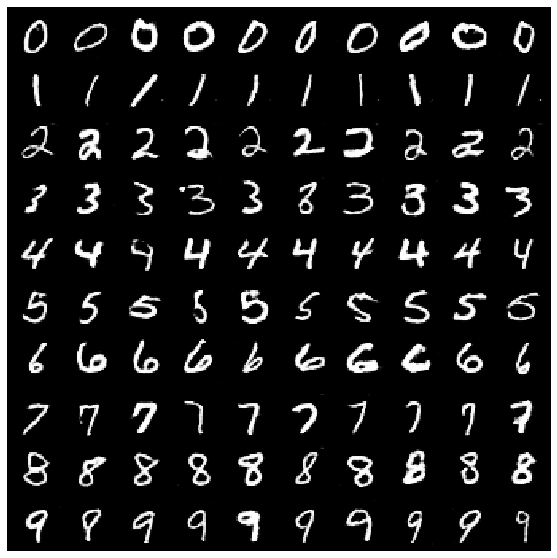

[ 6225/ 7812]	Loss_D: 1.0635	Loss_G: 1.0400	D(x): 0.5794	D(G(z)): 0.3822
learning rate change!
[ 6250/ 7812]	Loss_D: 1.0060	Loss_G: 0.9931	D(x): 0.6277	D(G(z)): 0.3890
[ 6275/ 7812]	Loss_D: 1.0648	Loss_G: 0.9491	D(x): 0.6370	D(G(z)): 0.4330
[ 6300/ 7812]	Loss_D: 1.0092	Loss_G: 1.0249	D(x): 0.6199	D(G(z)): 0.3840


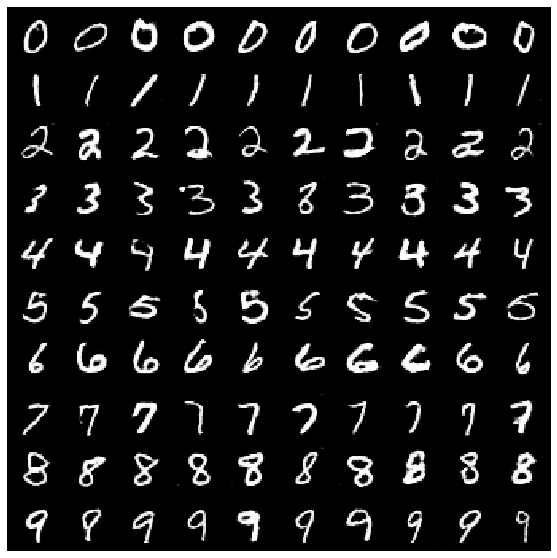

[ 6325/ 7812]	Loss_D: 1.0165	Loss_G: 0.9820	D(x): 0.5917	D(G(z)): 0.3586
[ 6350/ 7812]	Loss_D: 1.0007	Loss_G: 1.0119	D(x): 0.6134	D(G(z)): 0.3750
[ 6375/ 7812]	Loss_D: 1.0741	Loss_G: 0.9839	D(x): 0.6140	D(G(z)): 0.4201
[ 6400/ 7812]	Loss_D: 1.0652	Loss_G: 1.0252	D(x): 0.5757	D(G(z)): 0.3784


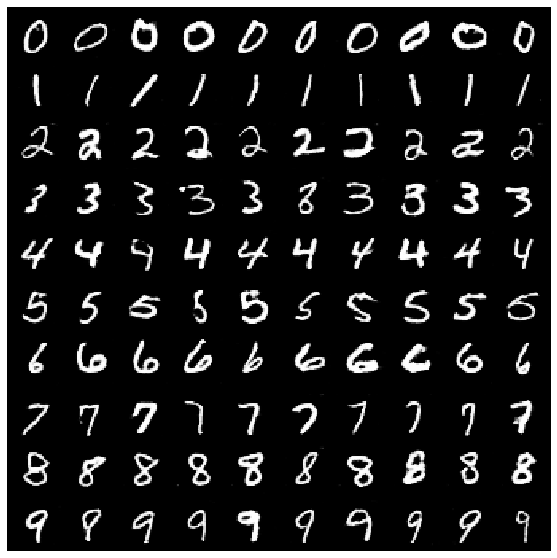

[ 6425/ 7812]	Loss_D: 1.1033	Loss_G: 0.9227	D(x): 0.6001	D(G(z)): 0.4210
[ 6450/ 7812]	Loss_D: 1.0524	Loss_G: 0.9705	D(x): 0.5916	D(G(z)): 0.3879
[ 6475/ 7812]	Loss_D: 1.0457	Loss_G: 1.0453	D(x): 0.6120	D(G(z)): 0.4024
[ 6500/ 7812]	Loss_D: 1.0590	Loss_G: 0.9953	D(x): 0.5924	D(G(z)): 0.3917


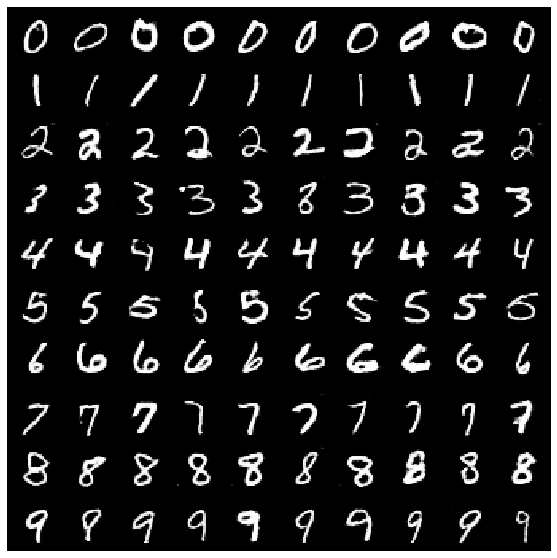

[ 6525/ 7812]	Loss_D: 0.9643	Loss_G: 0.9174	D(x): 0.6467	D(G(z)): 0.3914
[ 6550/ 7812]	Loss_D: 0.9553	Loss_G: 1.0257	D(x): 0.6521	D(G(z)): 0.3860
[ 6575/ 7812]	Loss_D: 0.9890	Loss_G: 1.0201	D(x): 0.6323	D(G(z)): 0.3824
[ 6600/ 7812]	Loss_D: 1.0134	Loss_G: 0.9839	D(x): 0.6426	D(G(z)): 0.4120


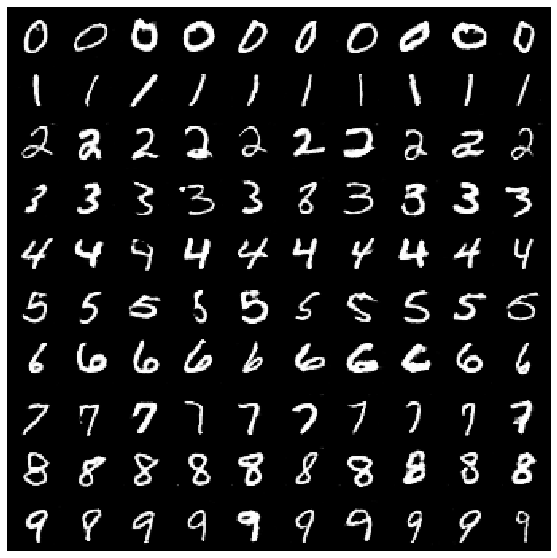

[ 6625/ 7812]	Loss_D: 0.9500	Loss_G: 0.9656	D(x): 0.6502	D(G(z)): 0.3826
[ 6650/ 7812]	Loss_D: 0.9585	Loss_G: 1.0349	D(x): 0.6446	D(G(z)): 0.3801
[ 6675/ 7812]	Loss_D: 1.1055	Loss_G: 0.9578	D(x): 0.5954	D(G(z)): 0.4178
[ 6700/ 7812]	Loss_D: 1.0727	Loss_G: 1.0122	D(x): 0.5821	D(G(z)): 0.3874


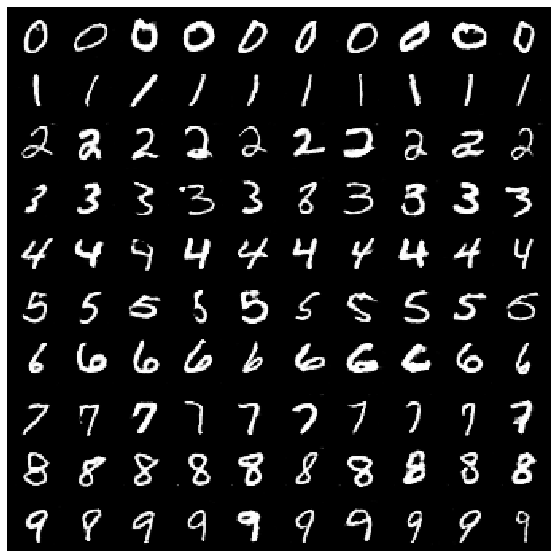

[ 6725/ 7812]	Loss_D: 1.0639	Loss_G: 0.9810	D(x): 0.5920	D(G(z)): 0.3928
[ 6750/ 7812]	Loss_D: 1.0136	Loss_G: 0.9913	D(x): 0.5899	D(G(z)): 0.3526
[ 6775/ 7812]	Loss_D: 1.0515	Loss_G: 0.9789	D(x): 0.5925	D(G(z)): 0.3854
[ 6800/ 7812]	Loss_D: 1.0262	Loss_G: 0.9834	D(x): 0.6077	D(G(z)): 0.3850


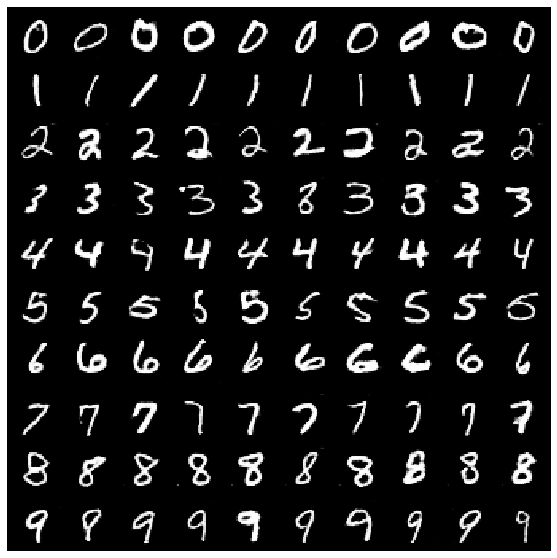

[ 6825/ 7812]	Loss_D: 1.0142	Loss_G: 1.0697	D(x): 0.6416	D(G(z)): 0.4117
[ 6850/ 7812]	Loss_D: 1.0006	Loss_G: 0.9830	D(x): 0.6189	D(G(z)): 0.3815
[ 6875/ 7812]	Loss_D: 1.0882	Loss_G: 0.9608	D(x): 0.5697	D(G(z)): 0.3814
[ 6900/ 7812]	Loss_D: 1.0768	Loss_G: 1.0061	D(x): 0.5988	D(G(z)): 0.4024


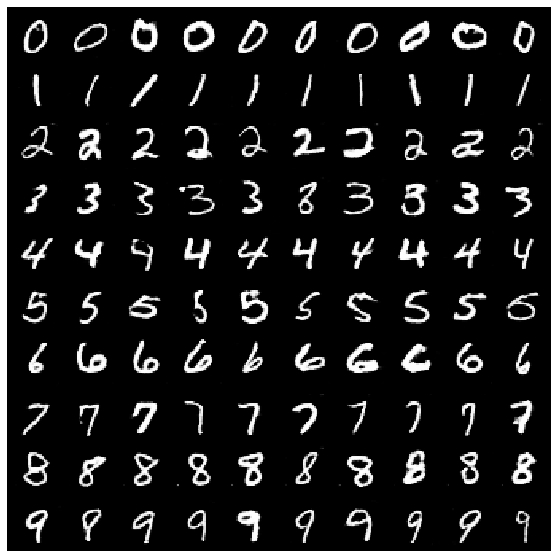

[ 6925/ 7812]	Loss_D: 1.0568	Loss_G: 0.9484	D(x): 0.5994	D(G(z)): 0.3952
[ 6950/ 7812]	Loss_D: 1.0457	Loss_G: 1.0004	D(x): 0.6073	D(G(z)): 0.3957
[ 6975/ 7812]	Loss_D: 1.0435	Loss_G: 1.0021	D(x): 0.5950	D(G(z)): 0.3862
[ 7000/ 7812]	Loss_D: 0.9859	Loss_G: 0.9544	D(x): 0.6286	D(G(z)): 0.3850


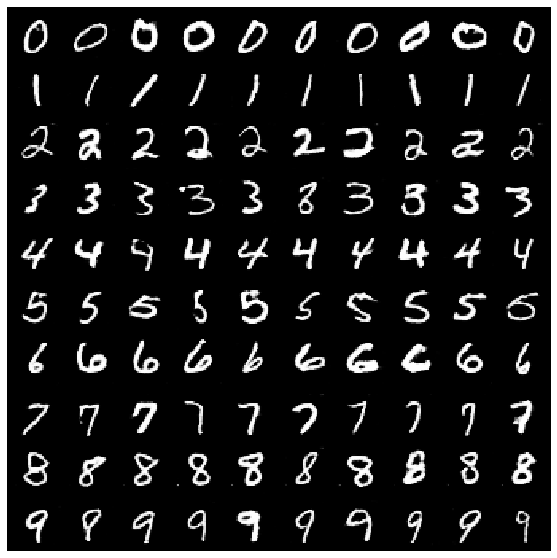

[ 7025/ 7812]	Loss_D: 1.0370	Loss_G: 0.9717	D(x): 0.6080	D(G(z)): 0.3906
[ 7050/ 7812]	Loss_D: 1.0729	Loss_G: 1.0784	D(x): 0.5880	D(G(z)): 0.3946
[ 7075/ 7812]	Loss_D: 1.0174	Loss_G: 1.0191	D(x): 0.6343	D(G(z)): 0.4099
[ 7100/ 7812]	Loss_D: 0.9735	Loss_G: 1.0463	D(x): 0.6268	D(G(z)): 0.3757


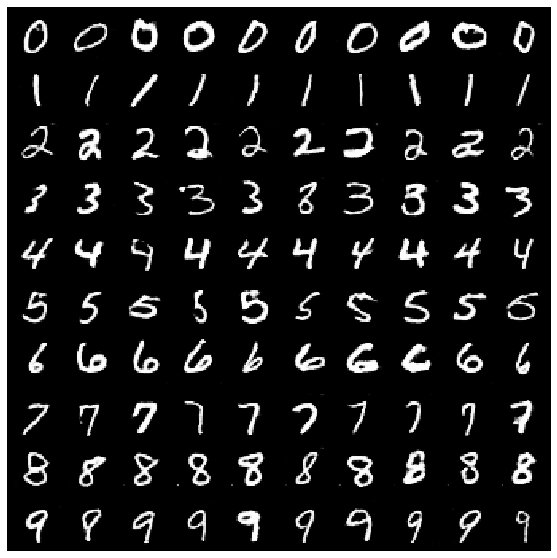

[ 7125/ 7812]	Loss_D: 1.1037	Loss_G: 1.0175	D(x): 0.5957	D(G(z)): 0.4149
[ 7150/ 7812]	Loss_D: 1.0016	Loss_G: 1.0006	D(x): 0.6387	D(G(z)): 0.4006
[ 7175/ 7812]	Loss_D: 1.1020	Loss_G: 0.8853	D(x): 0.5873	D(G(z)): 0.4068
[ 7200/ 7812]	Loss_D: 1.0655	Loss_G: 1.0303	D(x): 0.5978	D(G(z)): 0.3962


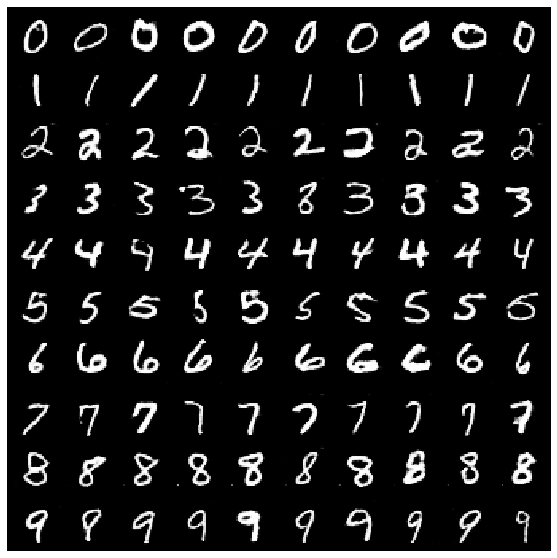

[ 7225/ 7812]	Loss_D: 1.0795	Loss_G: 0.9768	D(x): 0.5904	D(G(z)): 0.3918
[ 7250/ 7812]	Loss_D: 1.0158	Loss_G: 0.9961	D(x): 0.6216	D(G(z)): 0.3912
[ 7275/ 7812]	Loss_D: 1.0345	Loss_G: 0.9460	D(x): 0.6451	D(G(z)): 0.4248
[ 7300/ 7812]	Loss_D: 1.1212	Loss_G: 0.9880	D(x): 0.5630	D(G(z)): 0.3903


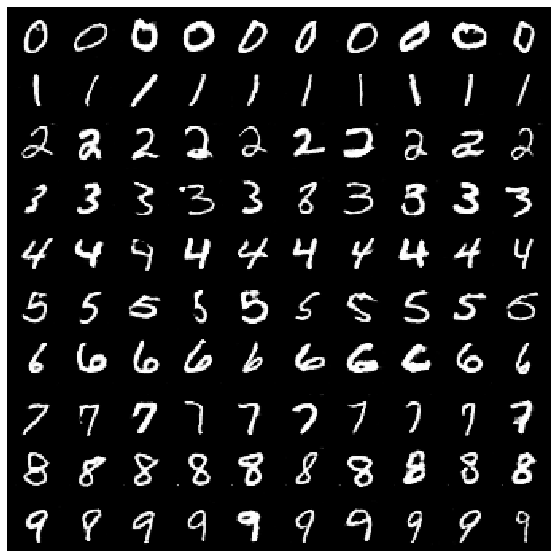

[ 7325/ 7812]	Loss_D: 1.0486	Loss_G: 0.9348	D(x): 0.6246	D(G(z)): 0.4140
[ 7350/ 7812]	Loss_D: 1.0206	Loss_G: 1.0005	D(x): 0.6274	D(G(z)): 0.4037
[ 7375/ 7812]	Loss_D: 1.0915	Loss_G: 1.0391	D(x): 0.5672	D(G(z)): 0.3765
[ 7400/ 7812]	Loss_D: 1.0515	Loss_G: 0.9693	D(x): 0.6206	D(G(z)): 0.4115


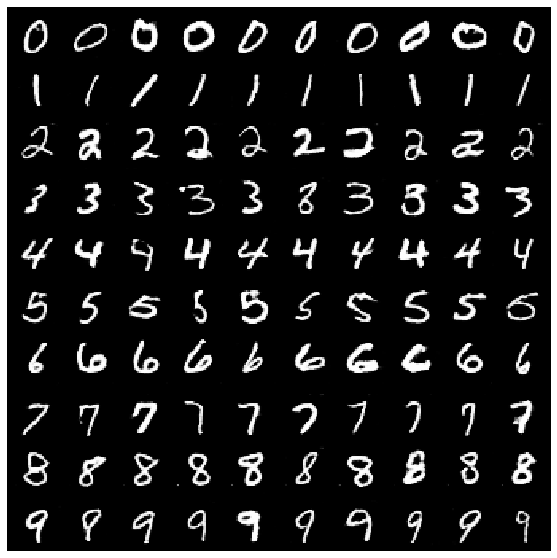

[ 7425/ 7812]	Loss_D: 1.0708	Loss_G: 0.9843	D(x): 0.5689	D(G(z)): 0.3716
[ 7450/ 7812]	Loss_D: 0.9876	Loss_G: 0.9665	D(x): 0.6464	D(G(z)): 0.4012
[ 7475/ 7812]	Loss_D: 1.0851	Loss_G: 1.0362	D(x): 0.5927	D(G(z)): 0.4006
[ 7500/ 7812]	Loss_D: 1.0758	Loss_G: 1.0148	D(x): 0.5555	D(G(z)): 0.3597


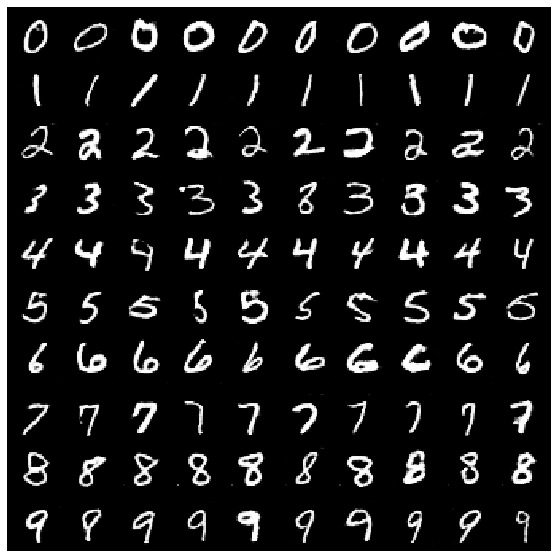

[ 7525/ 7812]	Loss_D: 1.0155	Loss_G: 0.9703	D(x): 0.6244	D(G(z)): 0.3970
[ 7550/ 7812]	Loss_D: 1.0584	Loss_G: 1.0384	D(x): 0.5984	D(G(z)): 0.3944
[ 7575/ 7812]	Loss_D: 1.0855	Loss_G: 0.9310	D(x): 0.5624	D(G(z)): 0.3742
[ 7600/ 7812]	Loss_D: 1.0226	Loss_G: 0.9293	D(x): 0.6065	D(G(z)): 0.3872


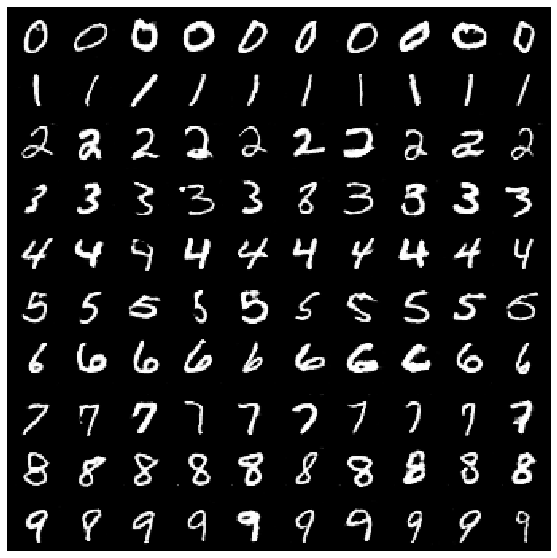

[ 7625/ 7812]	Loss_D: 0.9953	Loss_G: 0.9735	D(x): 0.6339	D(G(z)): 0.3904
[ 7650/ 7812]	Loss_D: 1.0315	Loss_G: 1.0520	D(x): 0.6186	D(G(z)): 0.3976
[ 7675/ 7812]	Loss_D: 0.9864	Loss_G: 1.0126	D(x): 0.6317	D(G(z)): 0.3849
[ 7700/ 7812]	Loss_D: 1.0591	Loss_G: 0.9666	D(x): 0.5959	D(G(z)): 0.3946


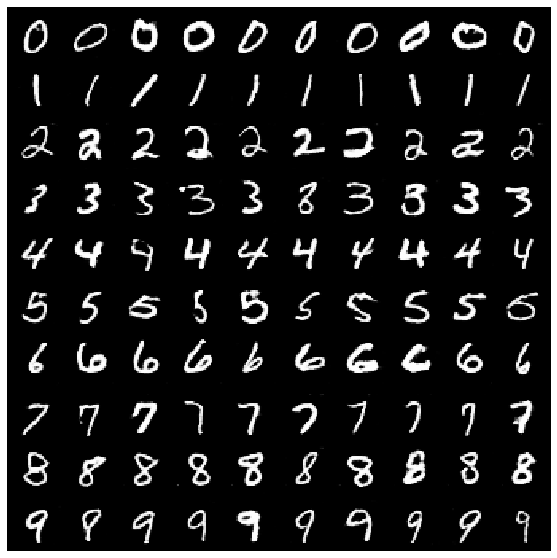

[ 7725/ 7812]	Loss_D: 0.9823	Loss_G: 0.9363	D(x): 0.6256	D(G(z)): 0.3798
[ 7750/ 7812]	Loss_D: 1.0461	Loss_G: 0.9661	D(x): 0.6049	D(G(z)): 0.3892
[ 7775/ 7812]	Loss_D: 1.1125	Loss_G: 1.0178	D(x): 0.5604	D(G(z)): 0.3865
[ 7800/ 7812]	Loss_D: 0.9765	Loss_G: 0.9956	D(x): 0.6275	D(G(z)): 0.3742


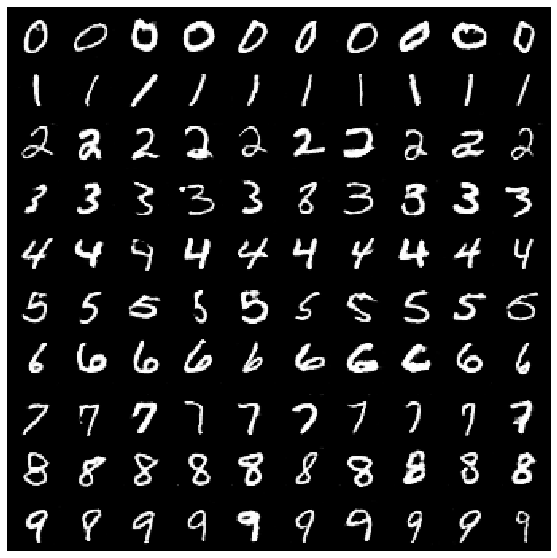

In [0]:
for i in range(steps):
    
    if i == steps_per_epoch * 11:
        optimizerG.param_groups[0]['lr'] /= 10
        optimizerD.param_groups[0]['lr'] /= 10
        print("learning rate change!")
        
    if i == steps_per_epoch * 16:
        optimizerG.param_groups[0]['lr'] /= 10
        optimizerD.param_groups[0]['lr'] /= 10
        print("learning rate change!")
    
    ########
    # Update D network: maximize log(D(x)) + log(1 - D(G(z)))
    for _ in range(nb_update_D):
        netD.zero_grad()
        
        # Create batches
        x_real, y_real, r_real = get_batch_real()
        x_fake, y_fake, r_fake = get_batch_fake(y_real)
        
        # Forward 
        r_hat_real = netD(x_real, y_real).to(device) # TODO
        r_hat_fake = netD(x_fake, y_real).to(device) # TODO
        #print(r_hat_real.size(),y_real.size(),r_hat_fake.size(),y_fake.size())
        #import pdb;pdb.set_trace()
        errD = criterion(r_hat_real.view(-1), r_real) + criterion(r_hat_fake.view(-1), r_fake) # TODO sum of criterion of real and fake samples
        
        # Backward
        # TODO backward & optimization step on D
        errD.backward()
        optimizerD.step()
        
        # Compute / save metrics
        avg_output_for_real = r_hat_real.mean().item()
        avg_output_for_fake = r_hat_fake.mean().item()    
        D_losses.append(errD.item())



    ########
    # Update G network: maximize log(D(G(z)))
    for _ in range(nb_update_G):
        netG.zero_grad()
        
        # TODO: forward + backward
        # NOTE: use errG as name for your loss variable, like errD above
        x_real, y_real, r_real = get_batch_real()
        x_fake, y_fake, r_fake = get_batch_fake(y_real, train_G=True)
        y_hat_G = netD(x_fake,y_real)
        #print(x_fake.shape,y_real.shape,y_hat_G.shape,r_fake.shape, y_hat_G.shape )
        errG = criterion( y_hat_G.view(-1), r_fake)

        errG.backward()
        optimizerG.step()
        
        # Compute / save metrics
        G_losses.append(errG.item())
        
    
    ########
    # Logs
    if i % 25 == 0:
        print('[%5d/%5d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f'
              % (i, steps, errD.item(), errG.item(), avg_output_for_real, avg_output_for_fake))

    if i % 100 == 0:
        with torch.no_grad():
            x_fake = netG(fixed_noise.to(device), fixed_y.to(device)).detach().cpu()
        img_list.append(vutils.make_grid(x_fake.reshape(x_fake.size(0), 1,32,32), padding=2, normalize=True, nrow=10))
        plt.figure(figsize=(10,10))
        plt.imshow(np.transpose(img_list[-1],(1,2,0)))
        plt.axis("off")
        plt.show()

# Display training evolution

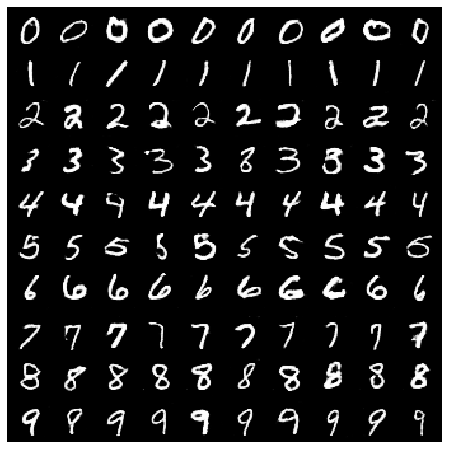

In [0]:
# Show generations
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

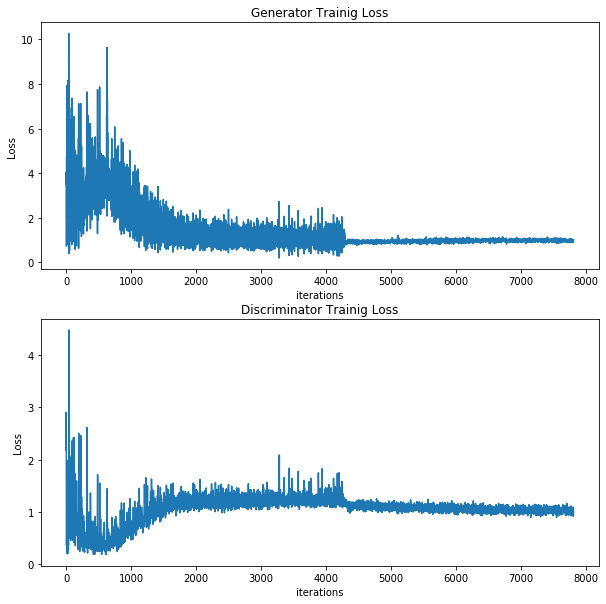

In [0]:
# Loss evolution
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plt.title("Generator Trainig Loss")
plt.plot(G_losses)
plt.xlabel("iterations")
plt.ylabel("Loss")

plt.subplot(2,1,2)
plt.title("Discriminator Trainig Loss")
plt.plot(D_losses)
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.show()